# Google Notebook specific Stuff

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install pytorch-lightning==1.3.3
# !pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.8.1-cp37-cp37m-linux_x86_64.whl
!pip install scGeneFit
!pip install scanpy
!pip install anndata
# my version of smashpy that fixed imports, nothing else was changed
!pip install matplotlib>=3.3.2
!pip install shap>=0.37.0
!pip install xgboost>=1.3.3
!pip install imbalanced-learn>=0.7.0
!pip install numba>=0.51.2
!pip install harmonypy>=0.0.5
!git clone https://github.com/beelze-b/SmashFork.git
!git clone https://github.com/ahsv/RankCorr.git

     |████████████████████████████████| 808kB 3.8MB/s 
     |████████████████████████████████| 10.6MB 5.9MB/s 
     |████████████████████████████████| 122kB 37.8MB/s 
     |████████████████████████████████| 829kB 42.3MB/s 
     |████████████████████████████████| 645kB 40.4MB/s 
     |████████████████████████████████| 235kB 43.1MB/s 
     |████████████████████████████████| 1.3MB 40.5MB/s 
     |████████████████████████████████| 296kB 45.1MB/s 
     |████████████████████████████████| 143kB 49.3MB/s 
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491070 sha256=f5d8a365c02493038876c836e493361cc2b392c347e8b16b9156546de22b3e6f
  Stored in directory: /root/.cache/pip/wheels/8b/99/a0/81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
Successfully built future
ERROR: tensorflow 2.5.0 has requirement tensorboard~=2.5, but you'll have tensorboard 2.4.1 which is incompatible.
  Found existing installation: tensorboard 2.5.0
    Uninstalling tensorboard-2.5.0:
      Succe

In [ ]:
# Check GPU

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, 
and then re-execute this cell.


In [ ]:
import sys
import os
# to import utils
sys.path.append(os.path.abspath('/content/gdrive/My Drive/Differentiable-Sparse-Subset-Selection/notebooks'))

# All the Imports

In [ ]:
%%time 
import itertools 
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder


from RankCorr.picturedRocks import Rocks
import SmashFork.smashpy as smashpy


import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F

from utils import *


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part o

CPU times: user 21.8 s, sys: 1.23 s, total: 23 s
Wall time: 26.6 s


# These should be parameters later on 

In [ ]:
z_size = 16
hidden_layer_size = 64

# really good results for vanilla VAE on synthetic data with EPOCHS set to 50, 
# but when running locally set to 10 for reasonable run times
batch_size = 64
batch_norm = True


global_t = 3.0

k_range = [10, 25, 50, 100, 250]
num_times = 5

gpus = 1
tpu_cores = None

In [ ]:
import multiprocessing

num_cores = multiprocessing.cpu_count()

# Here goes all the stuff that we change from dataset to dataset

In [ ]:
from os import path

In [ ]:
dataset_dir = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/'
model_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/models/'
viz_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/visualizations/'

if not path.exists(model_save_path):
  os.mkdir(model_save_path)

if not path.exists(model_save_path + 'experiment_data_folds/'):
  os.mkdir(model_save_path + 'experiment_data_folds/')
  
if not path.exists(viz_save_path):
  os.mkdir(viz_save_path)

  

# Dataset Specific Processing

`

In [ ]:
citeseq_adata = sc.read_h5ad(dataset_dir + "CITEseq.h5ad")

In [ ]:
citeseq_adata.shape

(8617, 500)

In [ ]:
X = citeseq_adata.X.copy()

In [ ]:
np.apply_along_axis(np.mean, 0, X)

array([ 1.4166219e-08,  0.0000000e+00, -1.8371816e-08, -1.7707775e-08,
        0.0000000e+00,  0.0000000e+00, -1.0624665e-08,  7.0831097e-09,
       -1.0624665e-08,  3.5415548e-09, -7.3044570e-09, -7.0831097e-09,
        1.4166219e-08,  0.0000000e+00,  3.5415548e-09,  0.0000000e+00,
        2.1249329e-08, -7.0831097e-09,  7.0831097e-09,  1.7707774e-09,
        3.5415548e-09, -7.0831097e-09, -7.0831097e-09, -1.0624665e-08,
        7.0831097e-09,  2.6561662e-09, -7.0831097e-09, -7.0831097e-09,
        0.0000000e+00,  6.6404154e-10,  0.0000000e+00,  0.0000000e+00,
       -7.0831097e-09,  1.0624665e-08,  7.0831097e-09, -5.3123324e-09,
       -3.5415548e-09, -3.5415548e-09, -1.4166219e-08,  1.7707774e-09,
       -3.5415548e-09, -1.0624665e-08, -1.0624665e-08,  1.4166219e-08,
        1.0624665e-08,  1.7707775e-08, -2.1249329e-08,  4.8696380e-09,
        8.8538874e-09, -1.0624665e-08,  1.0624665e-08, -3.5415548e-09,
        3.5415548e-09, -4.4269435e-10,  0.0000000e+00,  1.0624665e-08,
      

In [ ]:
np.apply_along_axis(np.var, 0, X)

array([0.99988383, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988407, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988407,
       0.99988395, 0.99988407, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988383,
       0.99988395, 0.99988395, 0.99988407, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988407, 0.99988395,
       0.99988383, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988407, 0.99988407,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988407,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988

In [ ]:
citeseq_adata.obs['annotation'] = citeseq_adata.obs['names']
labels = citeseq_adata.obs['names'].values
encoder = LabelEncoder()
encoder.fit(labels)
y = encoder.transform(labels)

In [ ]:
input_size = X.shape[1]

In [ ]:
X.shape

(8617, 500)

# Set Up Models

## Train Smash Random Forest





In [ ]:
# needed for random forest Smash
!mkdir Figures

 * Initialising ...

Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

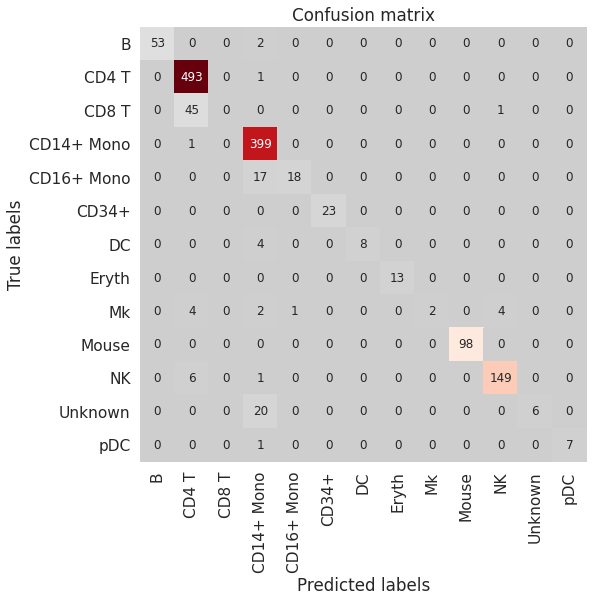

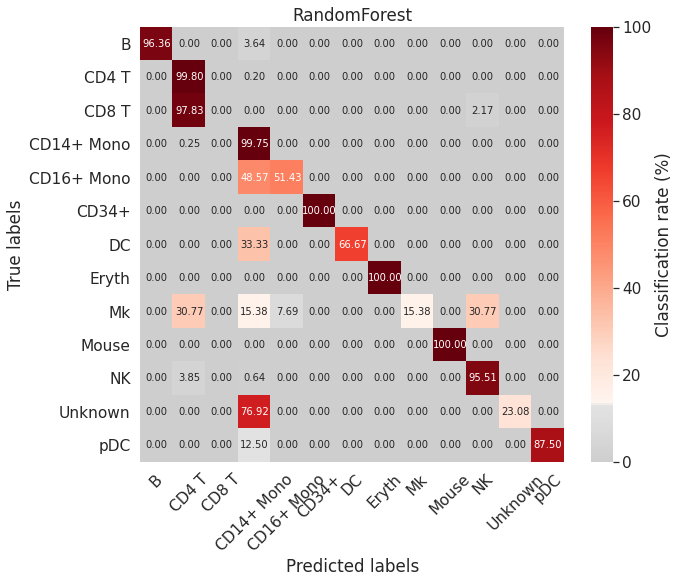

Accuracy: 0.9202320522117476: Misclassification: 0.07976794778825236
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        55
       CD4 T       0.90      1.00      0.95       494
       CD8 T       0.00      0.00      0.00        46
  CD14+ Mono       0.89      1.00      0.94       400
  CD16+ Mono       0.95      0.51      0.67        35
       CD34+       1.00      1.00      1.00        23
          DC       1.00      0.67      0.80        12
       Eryth       1.00      1.00      1.00        13
          Mk       1.00      0.15      0.27        13
       Mouse       1.00      1.00      1.00        98
          NK       0.97      0.96      0.96       156
     Unknown       1.00      0.23      0.38        26
         pDC       1.00      0.88      0.93         8

    accuracy                           0.92      1379
   macro avg       0.90      0.72      0.76      1379
weighted avg       0.89      0.92      0.90      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



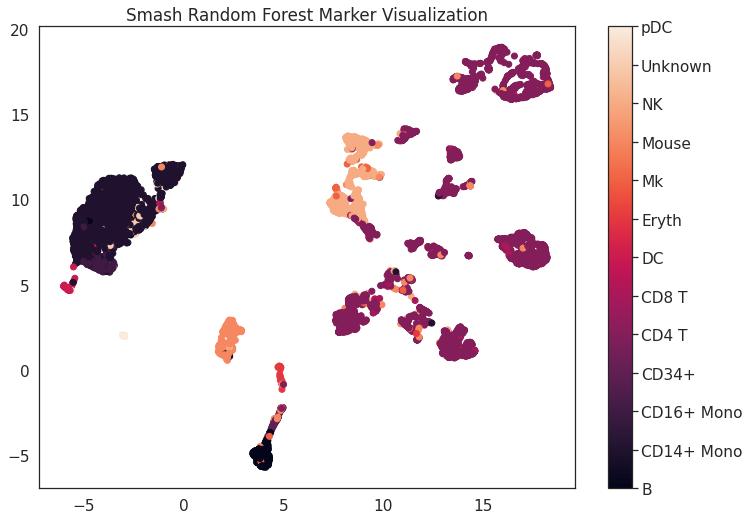

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

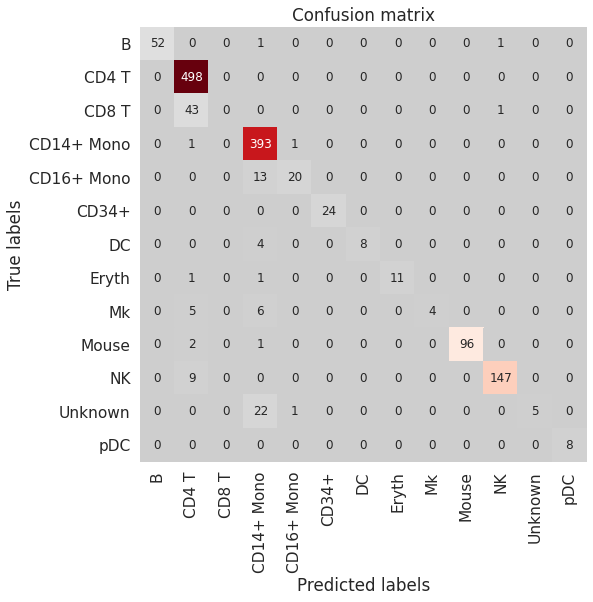

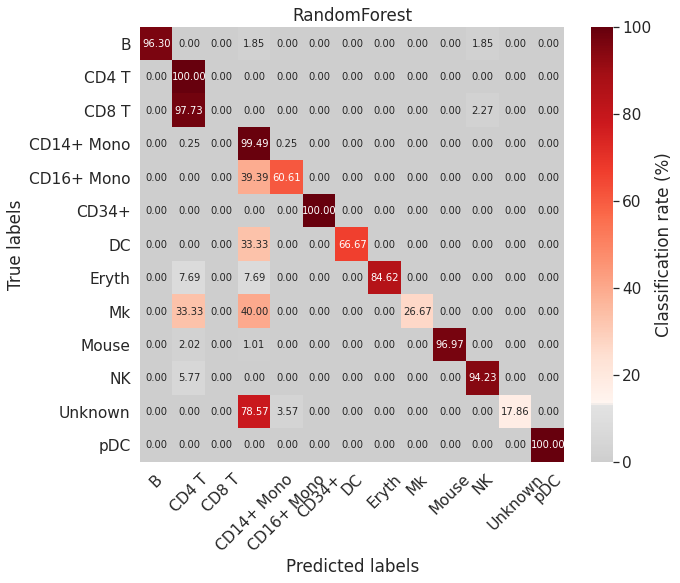

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



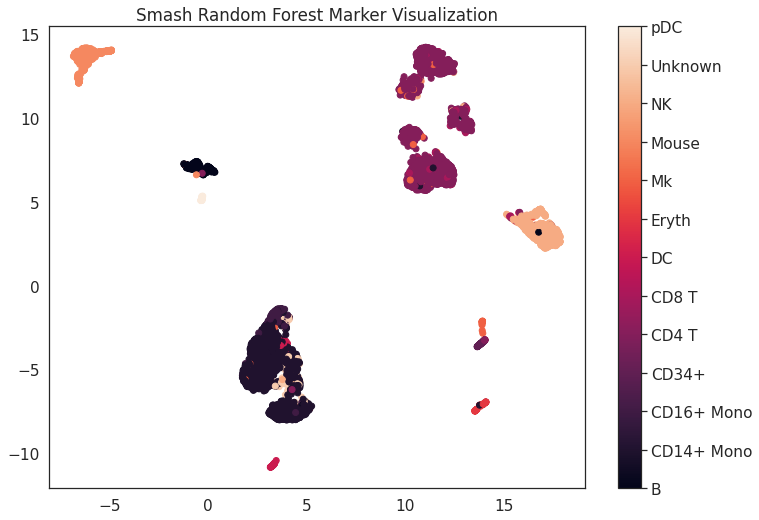

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

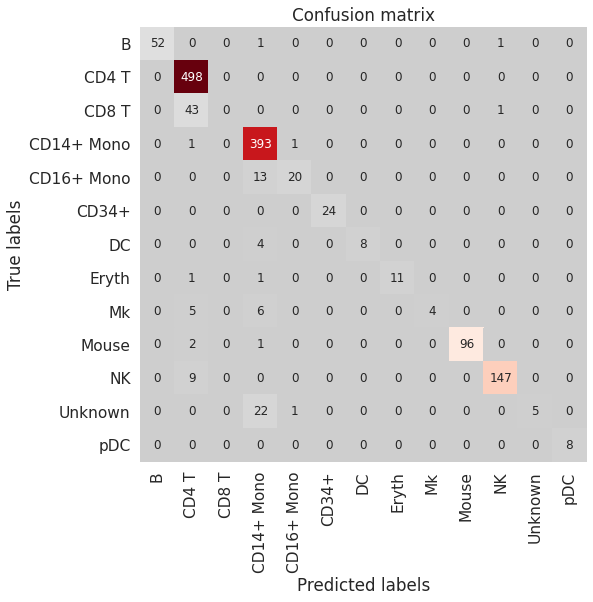

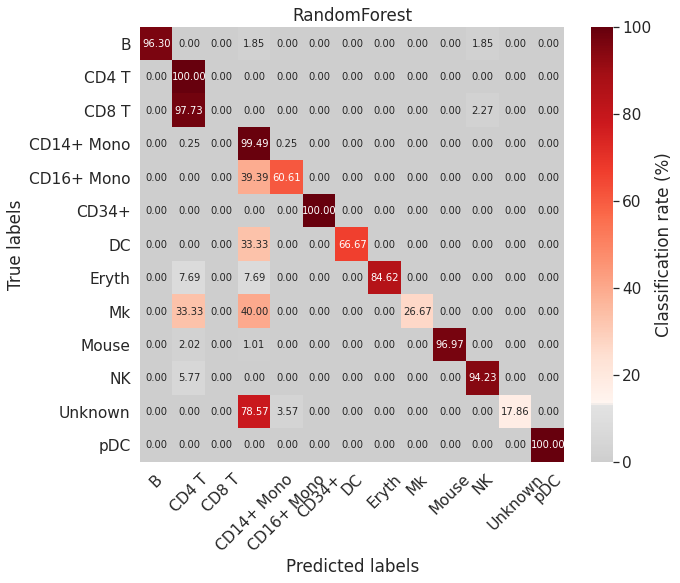

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



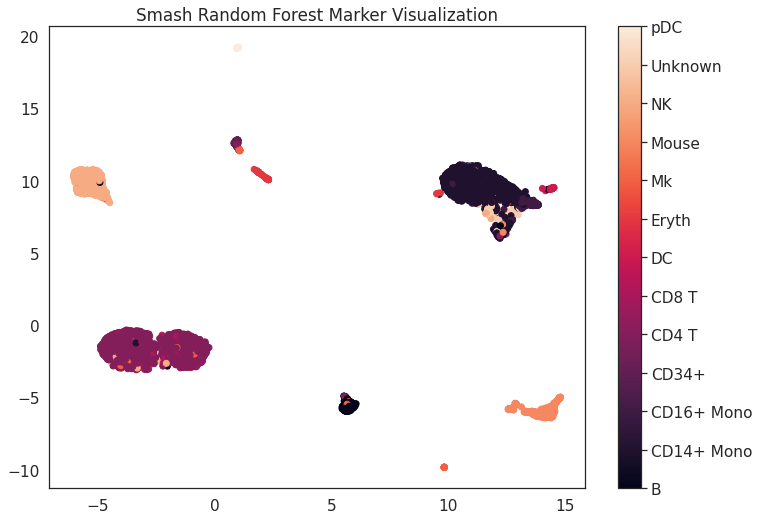

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

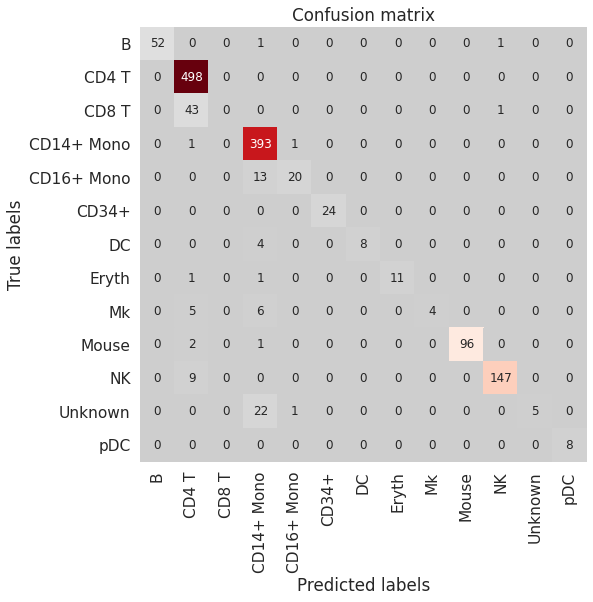

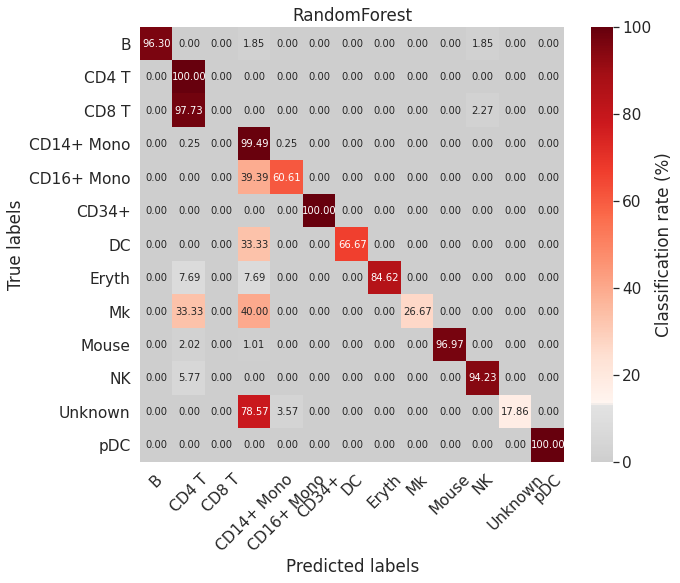

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



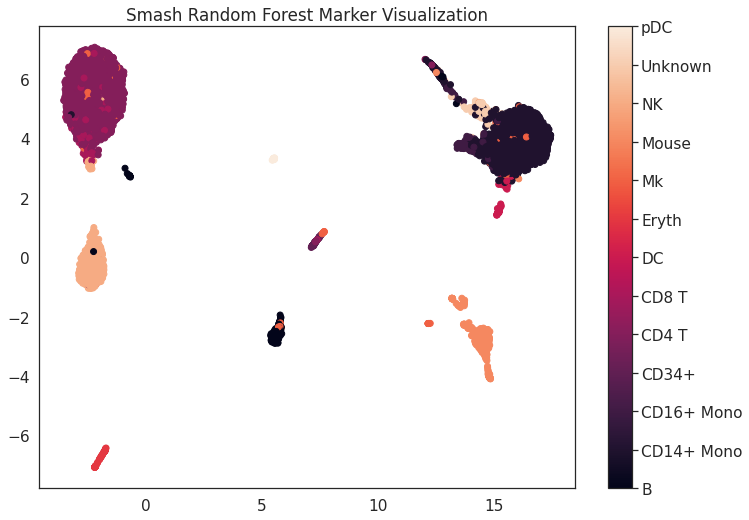

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

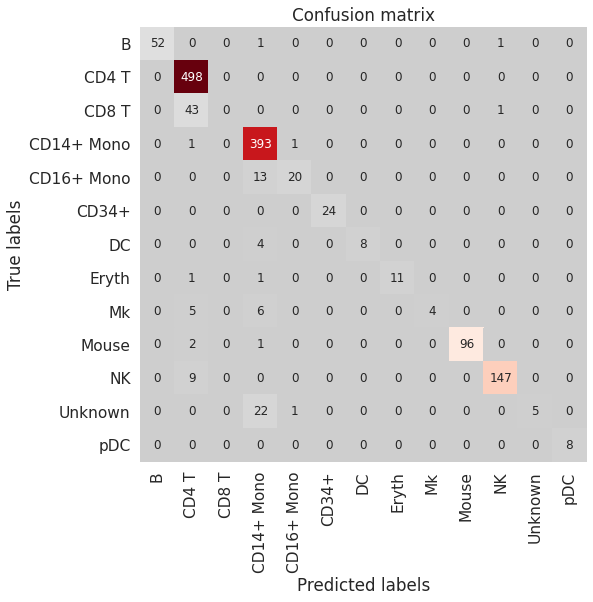

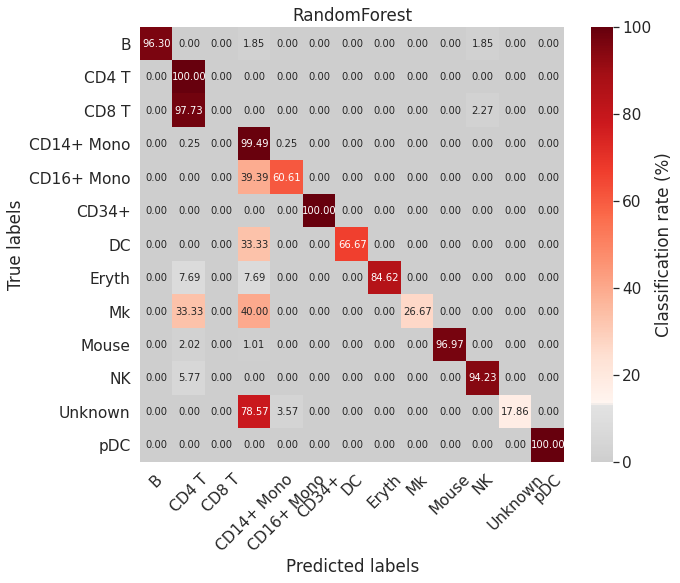

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



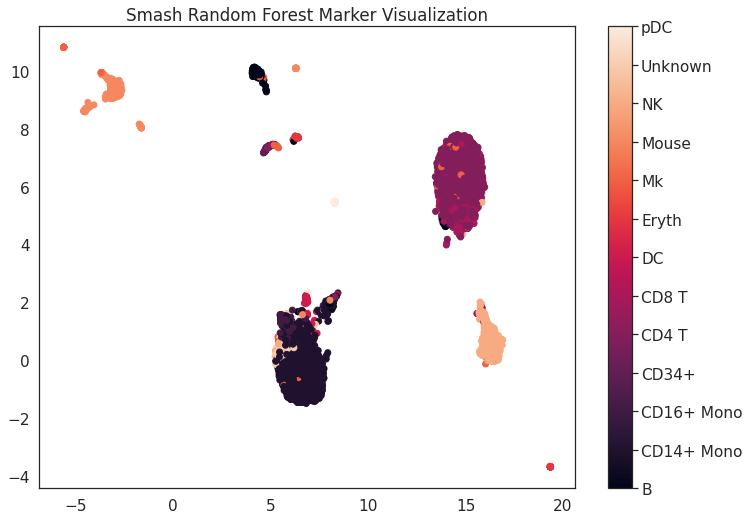

CPU times: user 4min 43s, sys: 9.46 s, total: 4min 52s
Wall time: 3min


In [ ]:
%%time
for k in k_range:
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = citeseq_adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    clf = sm.ensemble_learning(train_X_y, group_by="annotation", classifier="RandomForest", balance=True, verbose=True)
    selectedGenes, selectedGenes_dict = sm.gini_importance(train_X_y, clf, group_by="annotation", verbose=True, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = citeseq_adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_rf_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'smash_rf_markers_k_{}.npy'.format(k), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_rf_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Random Forest Marker Visualization', path = viz_save_path + 'smash_rf_markers_k_{}.png'.format(k), markers = smash_markers)

In [ ]:
results

(0.07366589327146167,
 {'0': {'f1-score': 0.9864864864864865,
   'precision': 1.0,
   'recall': 0.9733333333333334,
   'support': 75},
  '1': {'f1-score': 0.9511278195488722,
   'precision': 0.9084380610412927,
   'recall': 0.9980276134122288,
   'support': 507},
  '10': {'f1-score': 0.9872773536895675,
   'precision': 0.9797979797979798,
   'recall': 0.9948717948717949,
   'support': 195},
  '11': {'f1-score': 0.5333333333333333,
   'precision': 0.9230769230769231,
   'recall': 0.375,
   'support': 32},
  '12': {'f1-score': 0.9523809523809523,
   'precision': 1.0,
   'recall': 0.9090909090909091,
   'support': 11},
  '2': {'f1-score': 0.8750000000000001,
   'precision': 1.0,
   'recall': 0.7777777777777778,
   'support': 54},
  '3': {'f1-score': 0.9583333333333334,
   'precision': 0.9583333333333334,
   'recall': 0.9583333333333334,
   'support': 24},
  '4': {'f1-score': 0.943784639746635,
   'precision': 0.8962406015037594,
   'recall': 0.9966555183946488,
   'support': 598},
  '5': 

## Train Smash DNN

the data is treated a bit differently than our other models

 * Initialising ...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                16032     
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
activation (Activation)      (None, 32)                0         
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_1 (Batch (None, 16)                64        
_________________________________________________________________
activation_1 (Activation)    (None, 

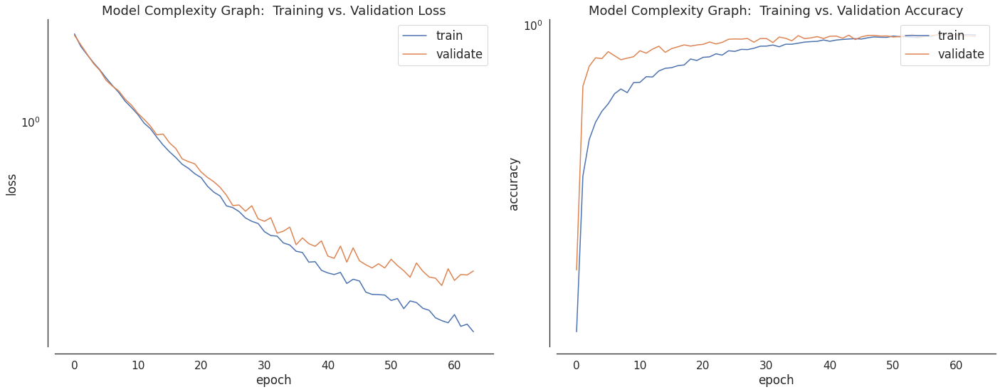

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

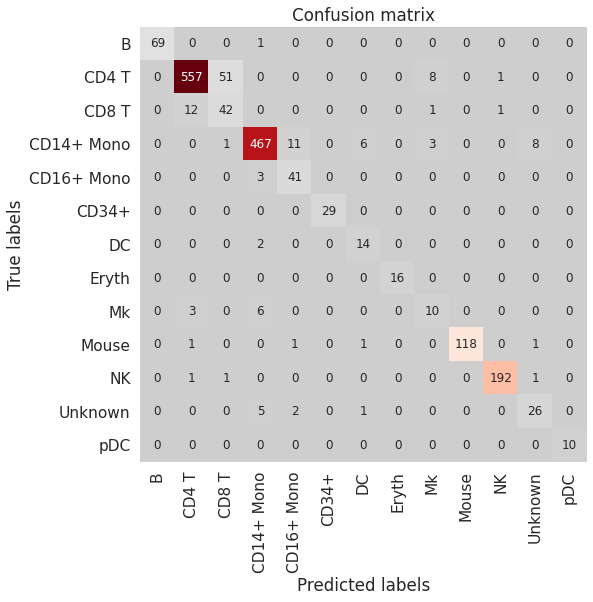

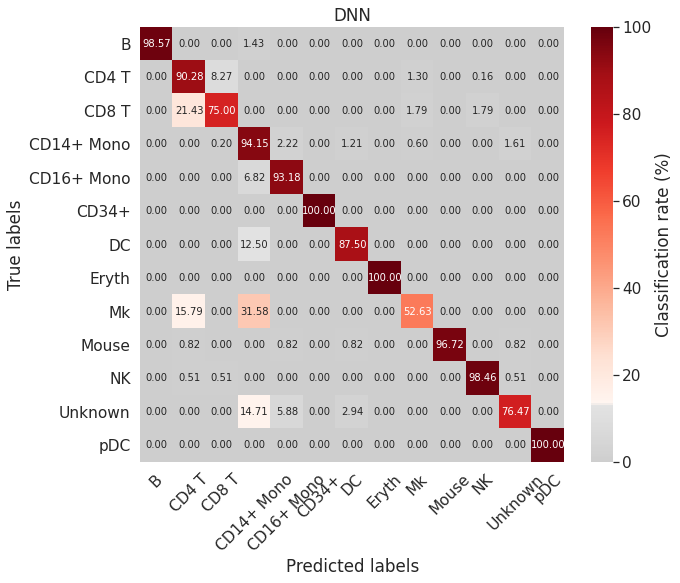

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:91: UserWarning:

keras is no longer supported, please use tf.keras instead.

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



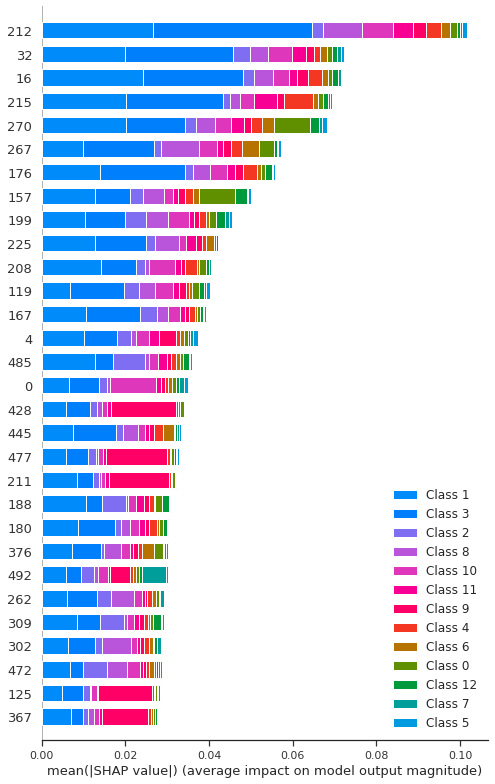

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



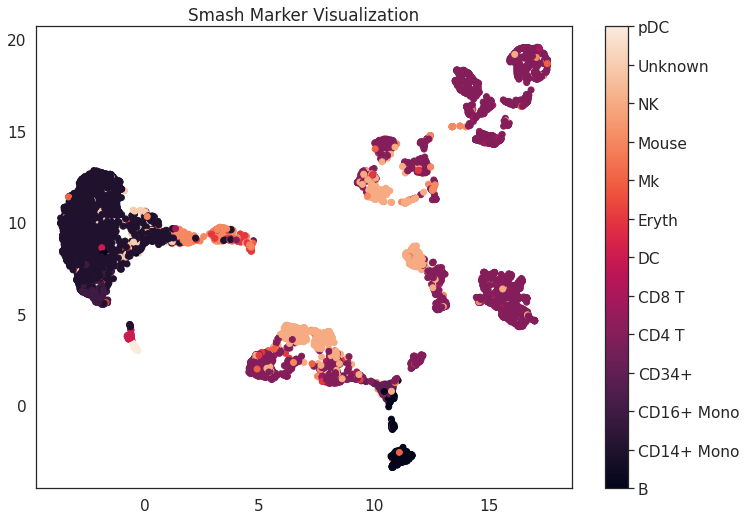

 * Initialising ...
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                16032     
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)                128       
_________________________________________________________________
activation_4 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_5 (Batch (None, 16)                64        
_________________________________________________________________
activation_5 (Activation)    (None

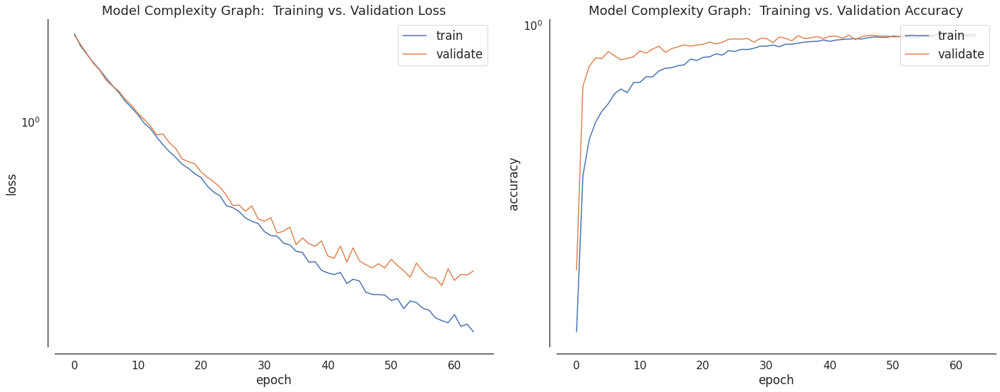

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

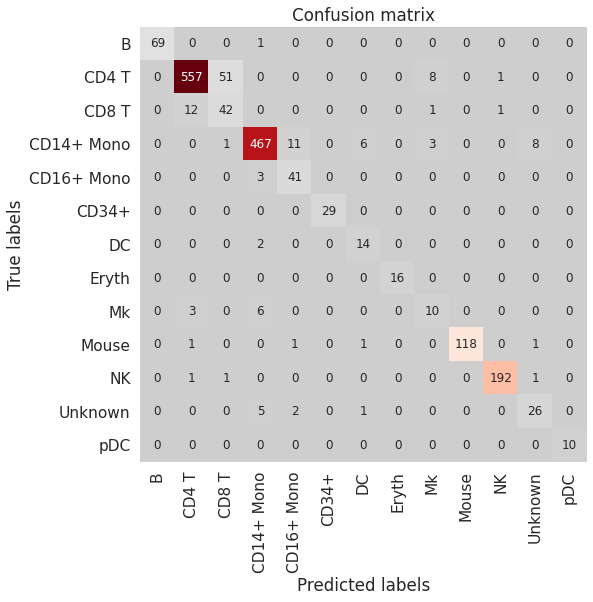

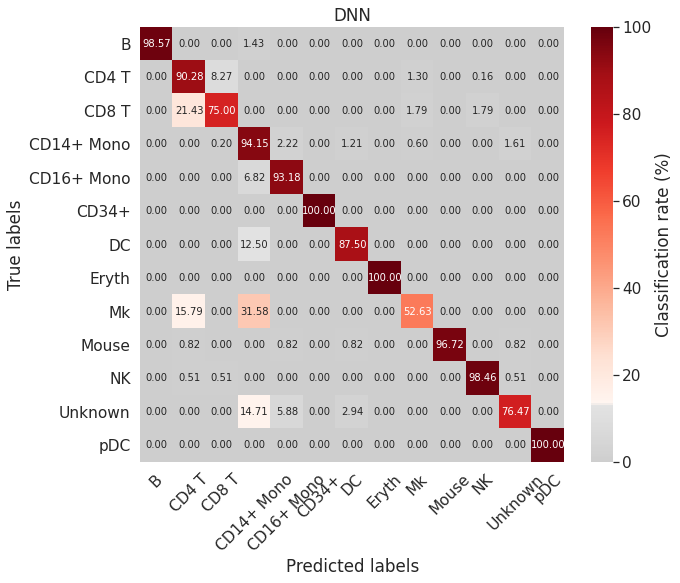

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



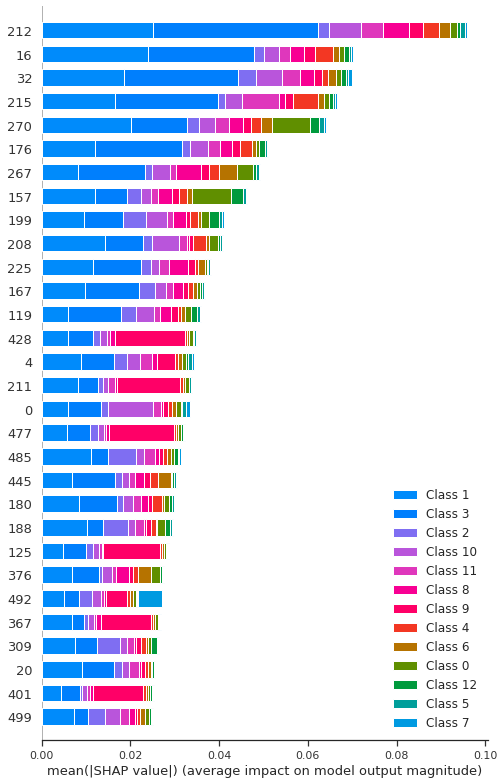

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



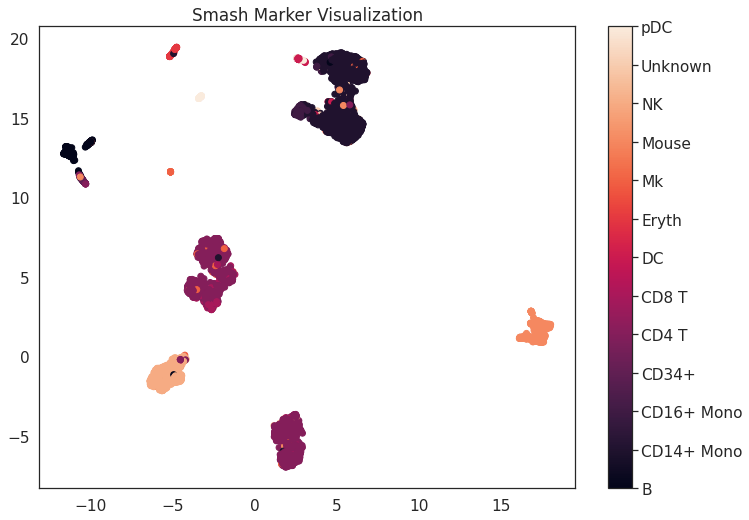

 * Initialising ...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_8 (Batch (None, 32)                128       
_________________________________________________________________
activation_8 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_9 (Batch (None, 16)                64        
_________________________________________________________________
activation_9 (Activation)    (None

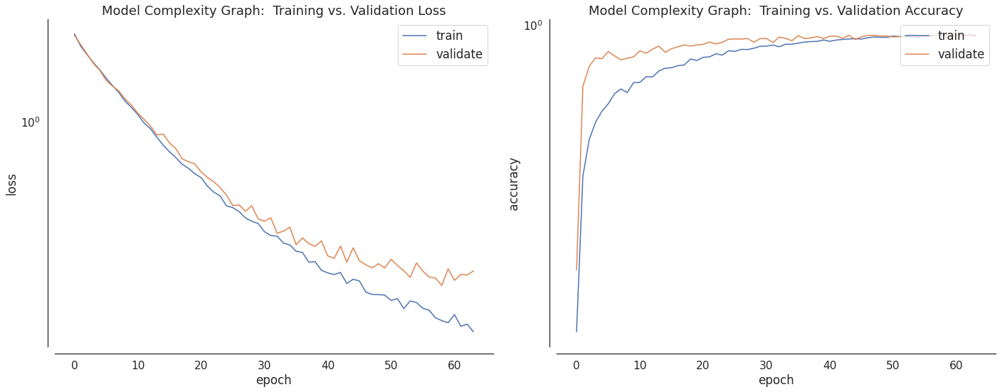

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

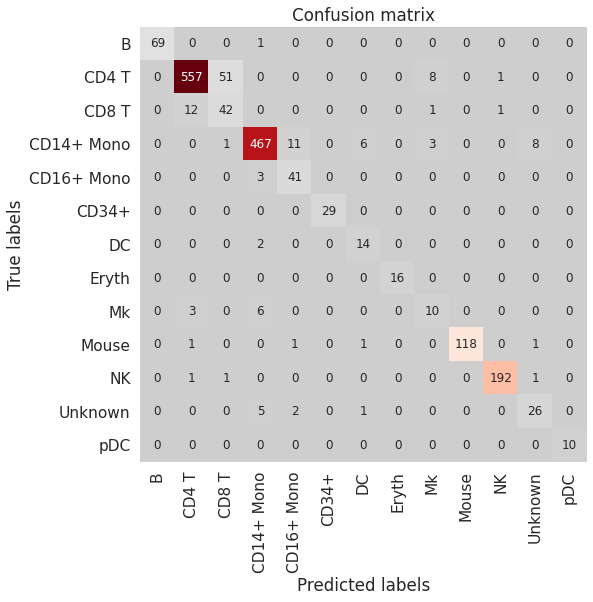

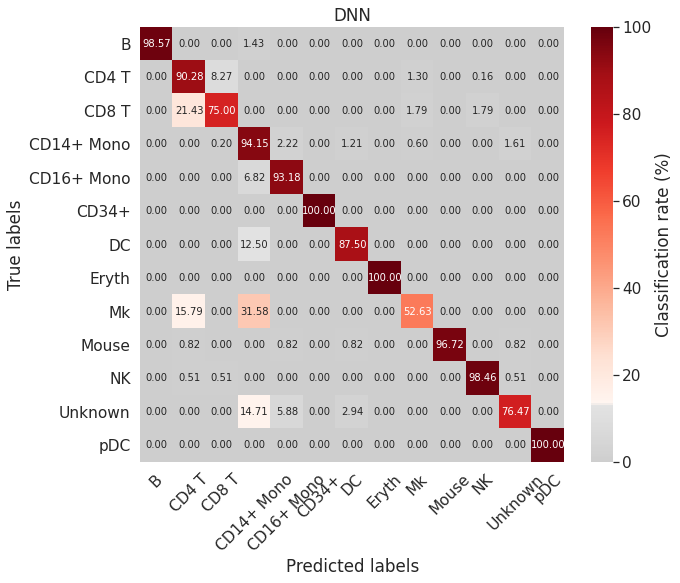

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



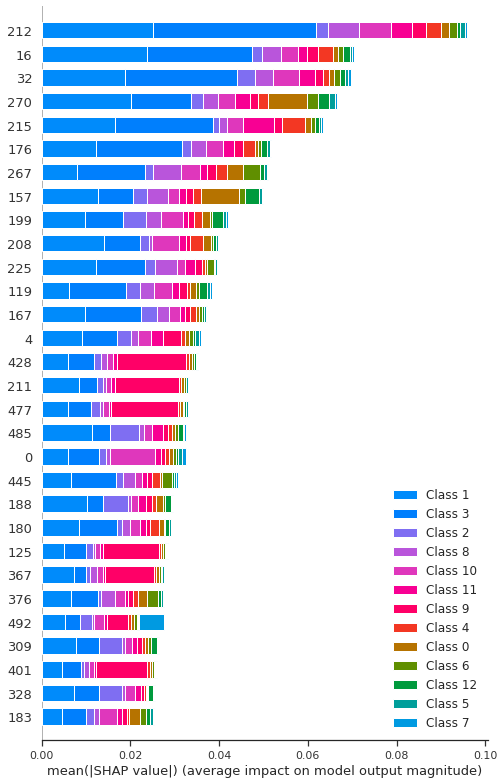

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



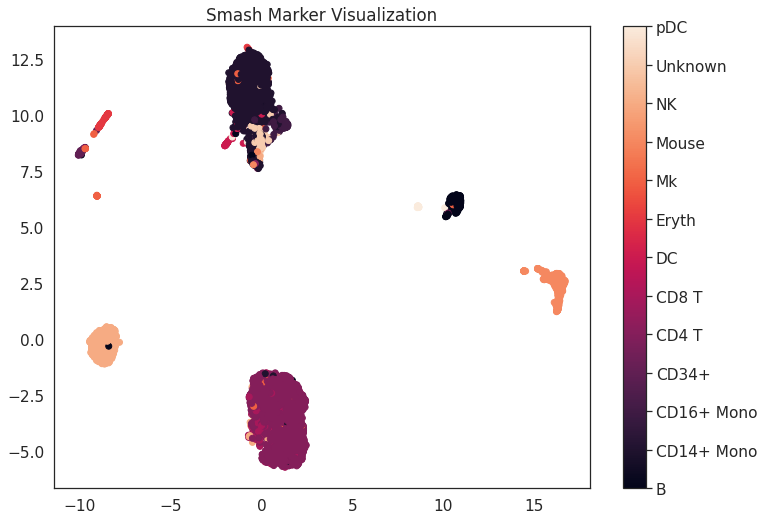

 * Initialising ...
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_12 (Batc (None, 32)                128       
_________________________________________________________________
activation_12 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_13 (Batc (None, 16)                64        
_________________________________________________________________
activation_13 (Activation)   (None

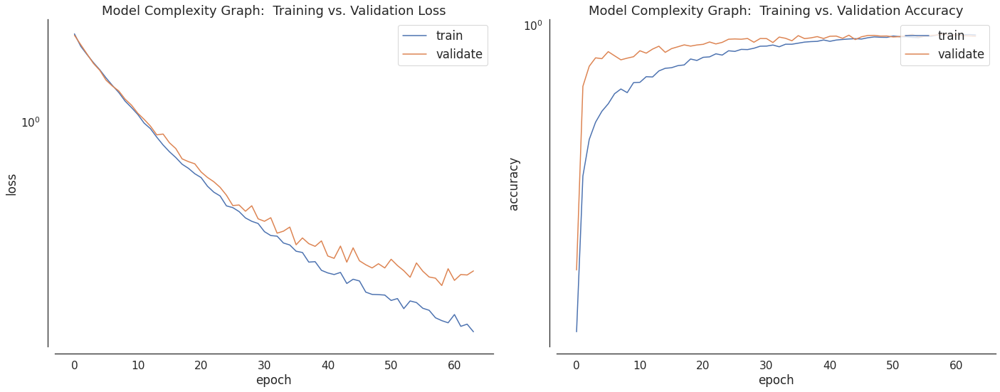

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

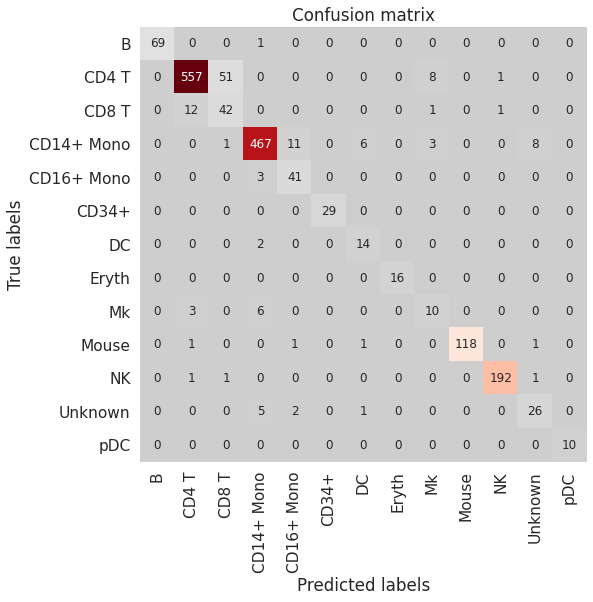

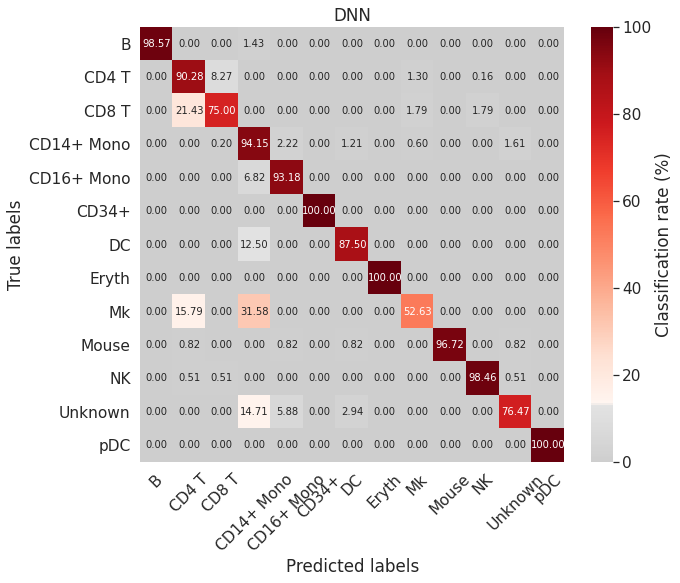

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



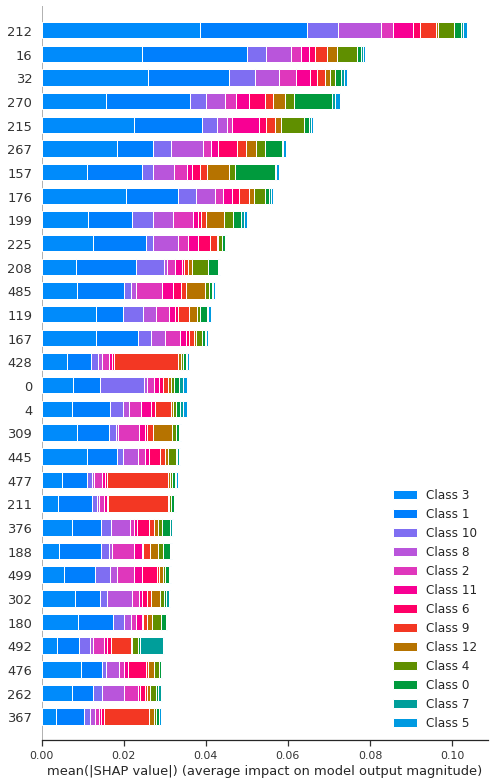

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



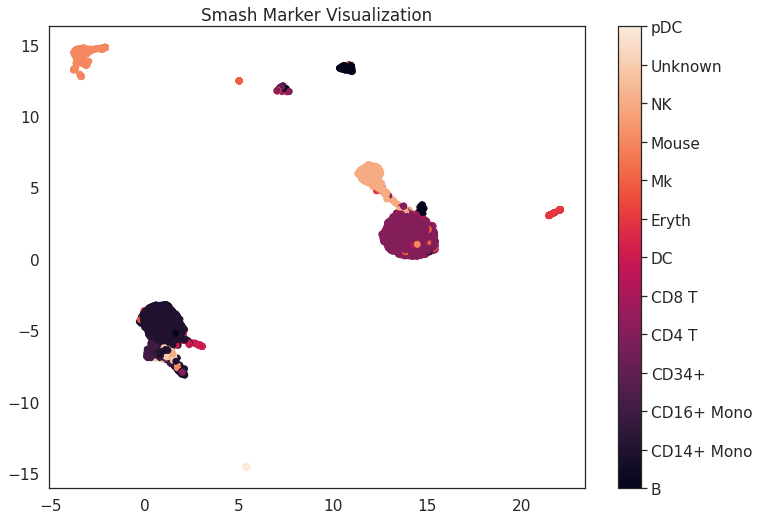

 * Initialising ...
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_16 (Batc (None, 32)                128       
_________________________________________________________________
activation_16 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_17 (Batc (None, 16)                64        
_________________________________________________________________
activation_17 (Activation)   (None

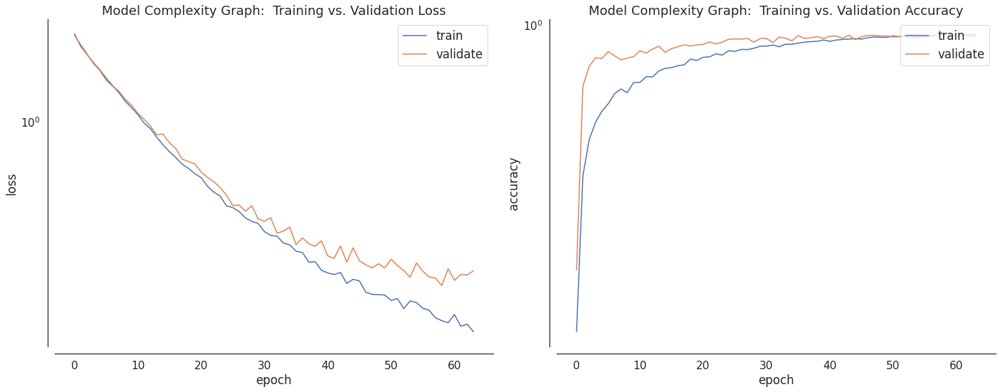

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

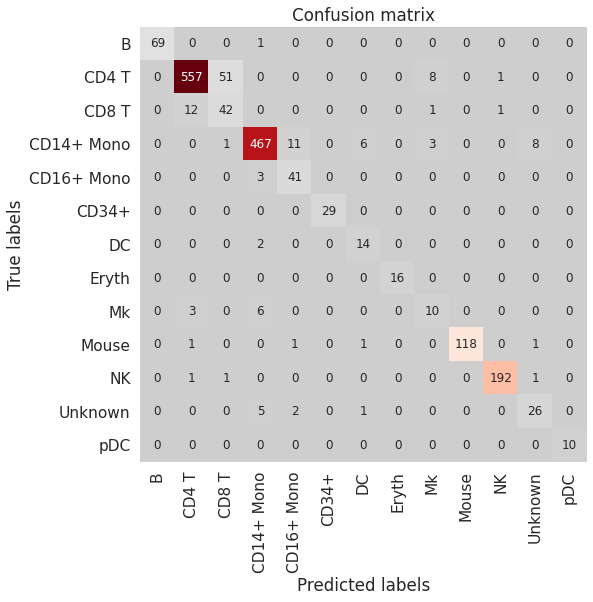

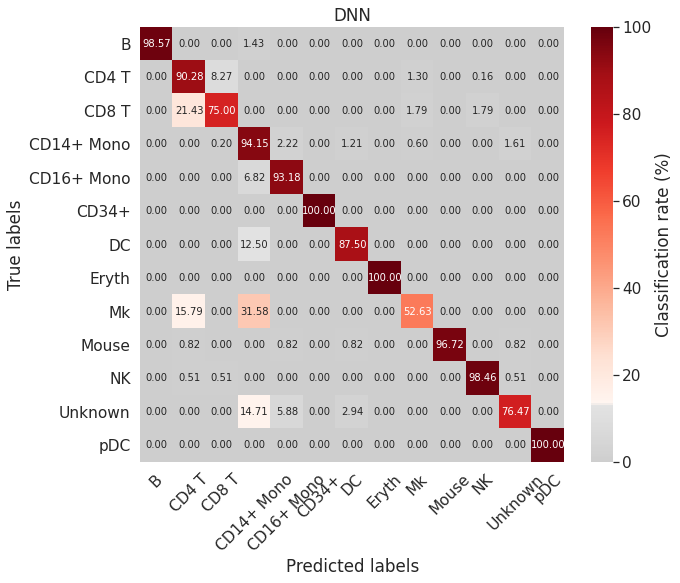

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 5ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



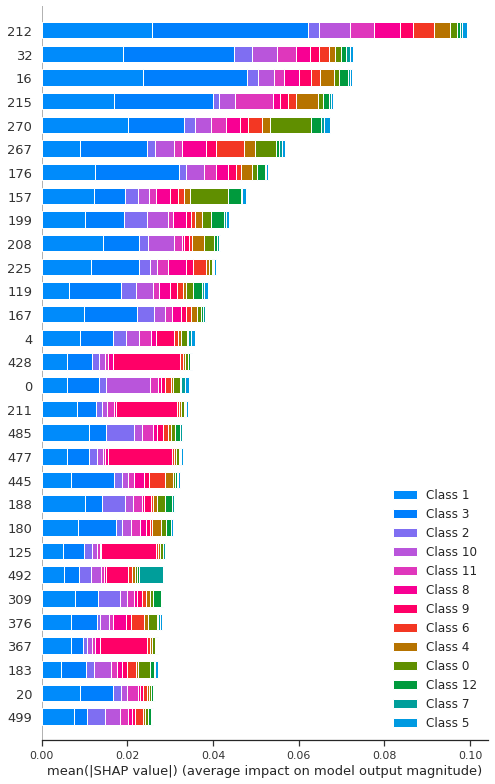

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



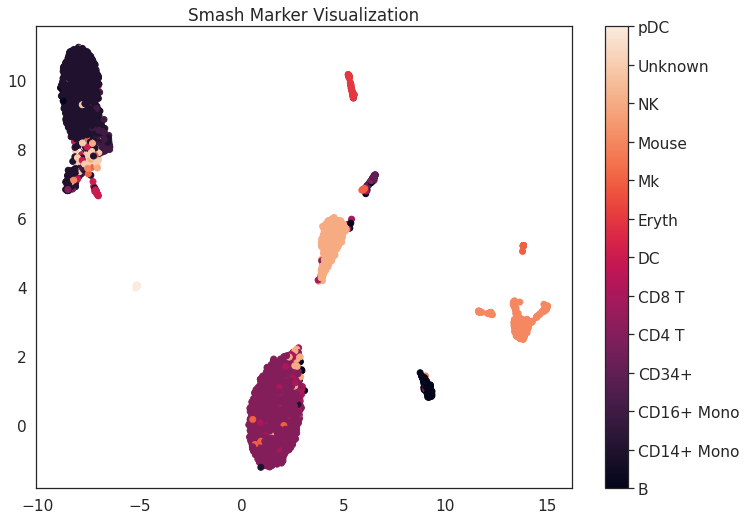

CPU times: user 10min 41s, sys: 1min 18s, total: 11min 59s
Wall time: 7min 23s


In [ ]:
%%time
for k in k_range:
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = citeseq_adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    sm.DNN(citeseq_adata, group_by="annotation", model=None, balance=True, verbose=True, save=False)
    selectedGenes, selectedGenes_dict = sm.run_shap(citeseq_adata, group_by="annotation", model=None, verbose=True, pct=0.1, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = citeseq_adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'smash_markers_k_{}.npy'.format(k), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Marker Visualization', path = viz_save_path + 'smash_markers_k_{}.png'.format(k), markers = smash_markers)

In [ ]:
results

(0.07424593967517401,
 {'0': {'f1-score': 0.9864864864864865,
   'precision': 1.0,
   'recall': 0.9733333333333334,
   'support': 75},
  '1': {'f1-score': 0.9502347417840376,
   'precision': 0.9068100358422939,
   'recall': 0.9980276134122288,
   'support': 507},
  '10': {'f1-score': 0.9897435897435898,
   'precision': 0.9897435897435898,
   'recall': 0.9897435897435898,
   'support': 195},
  '11': {'f1-score': 0.4285714285714286,
   'precision': 0.9,
   'recall': 0.28125,
   'support': 32},
  '12': {'f1-score': 0.9523809523809523,
   'precision': 1.0,
   'recall': 0.9090909090909091,
   'support': 11},
  '2': {'f1-score': 0.8979591836734693,
   'precision': 1.0,
   'recall': 0.8148148148148148,
   'support': 54},
  '3': {'f1-score': 0.9583333333333334,
   'precision': 0.9583333333333334,
   'recall': 0.9583333333333334,
   'support': 24},
  '4': {'f1-score': 0.943127962085308,
   'precision': 0.8937125748502994,
   'recall': 0.9983277591973244,
   'support': 598},
  '5': {'f1-score': 

## Train RankCorr

In [ ]:
lamb_range = [0.5, 1.5, 3, 7, 21.9]
lamb_i = 0

Excess Length of markers
12


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



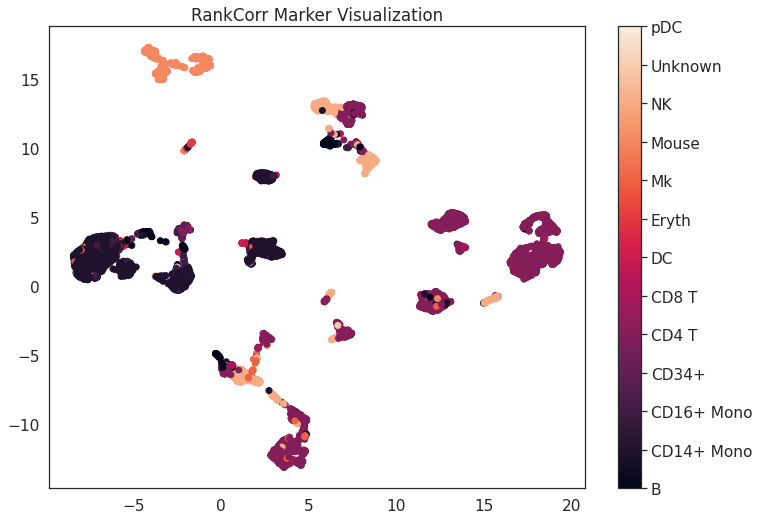

Excess Length of markers
30


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



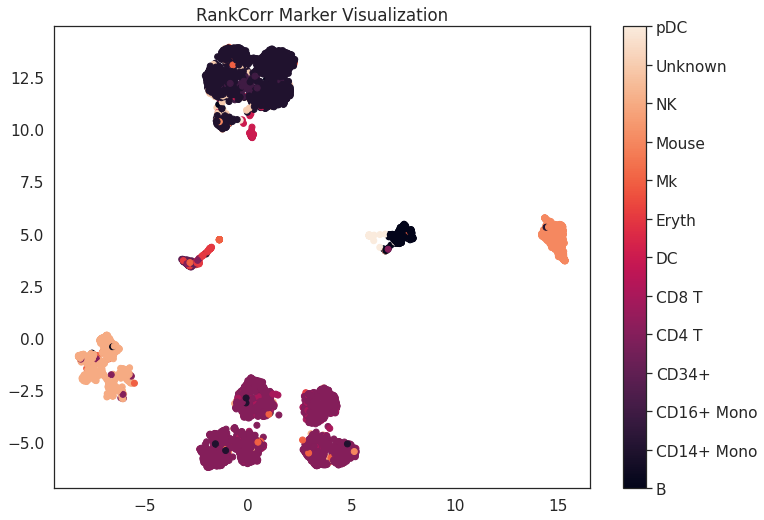

Excess Length of markers
55


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



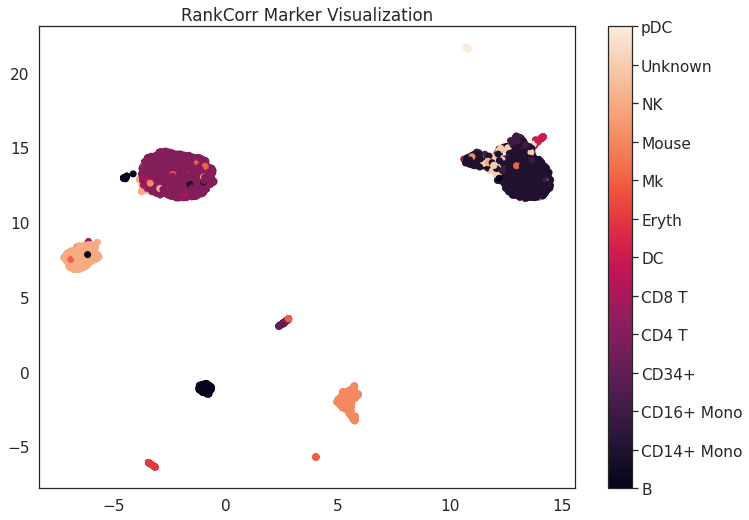

Excess Length of markers
109


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



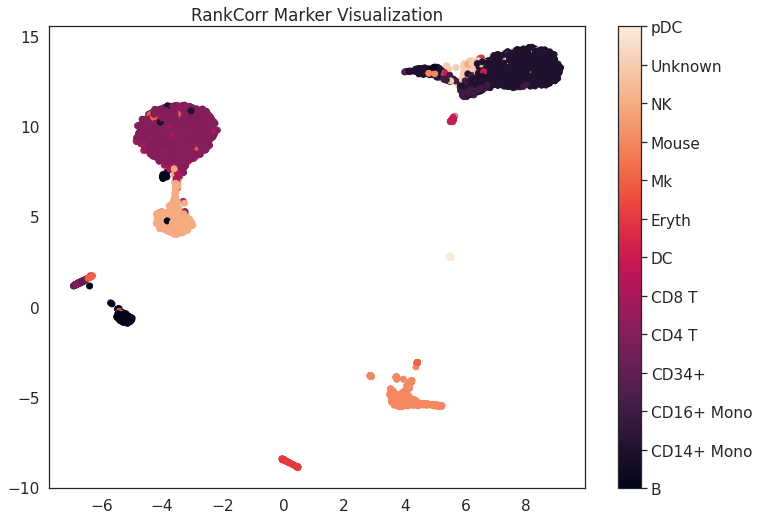

Excess Length of markers
266


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



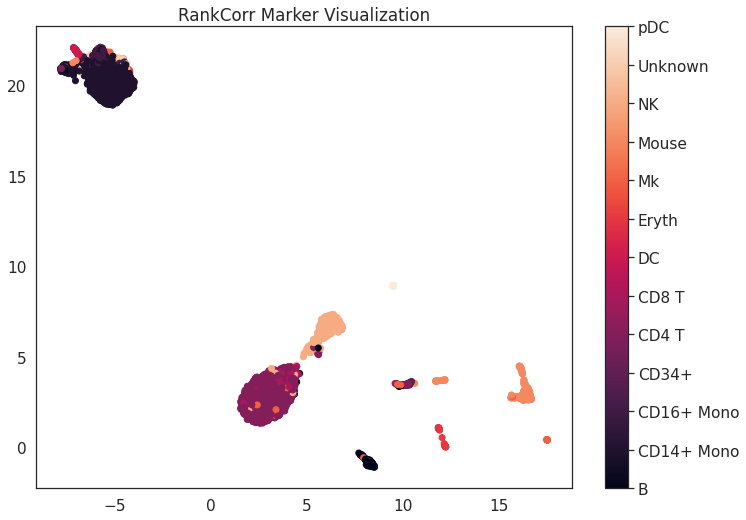

In [ ]:
for k in k_range:
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    data = Rocks(X_train, y_train)
    lamb = lamb_range[lamb_i]
    lamb_i = lamb_i + 1

    rankcorr_markers = data.CSrankMarkers(lamb=lamb, writeOut=False, keepZeros=False, onlyNonZero=False)
    if len(rankcorr_markers) < k:
        print(lamb)
        print(len(rankcorr_markers))
        print(k)
        raise Exception("Increase lamb for rank corr procedure")
    if len(rankcorr_markers) > k:
        print("Excess Length of markers")
        print(len(rankcorr_markers))
        rankcorr_markers = rankcorr_markers[:k]
    geneNames = np.array(citeseq_adata.var.index)
    data.genes = geneNames
    marker_genes = data.markers_to_genes(rankcorr_markers)
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = rankcorr_markers)
    np.save(model_save_path + 'rankcorr_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'rankcorr_markers_k_{}.npy'.format(k), rankcorr_markers)
    np.save(model_save_path + 'experiment_data_folds/rankcorr_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'RankCorr Marker Visualization', path = viz_save_path + 'rankcorr_markers_k_{}.png'.format(k), markers = rankcorr_markers)

In [ ]:
len(rankcorr_markers)

250

In [ ]:
print("Some, if not all, selected gene names")
print(marker_genes)

Some, if not all, selected gene names
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '45', '46', '48', '49', '51', '52', '53', '54', '55', '56', '58', '59', '61', '62', '63', '64', '65', '66', '67', '68', '69', '72', '73', '74', '75', '77', '78', '79', '80', '81', '84', '85', '86', '87', '88', '89', '91', '92', '93', '94', '97', '98', '99', '100', '101', '102', '104', '105', '106', '108', '109', '110', '111', '116', '117', '118', '119', '120', '121', '122', '125', '128', '130', '135', '138', '139', '140', '142', '143', '144', '145', '151', '153', '157', '158', '159', '161', '162', '166', '167', '169', '172', '175', '176', '179', '180', '182', '183', '184', '188', '189', '192', '195', '199', '202', '203', '205', '206', '207', '208', '210', '211', '212', '213', '214', '215', '216', '217', '218', '219'

In [ ]:
results

(0.07192575406032486,
 {'0': {'f1-score': 0.980891719745223,
   'precision': 1.0,
   'recall': 0.9625,
   'support': 80},
  '1': {'f1-score': 0.9551656920077973,
   'precision': 0.9176029962546817,
   'recall': 0.9959349593495935,
   'support': 492},
  '10': {'f1-score': 0.9595375722543352,
   'precision': 0.9764705882352941,
   'recall': 0.9431818181818182,
   'support': 176},
  '11': {'f1-score': 0.46153846153846156,
   'precision': 0.8571428571428571,
   'recall': 0.3157894736842105,
   'support': 38},
  '12': {'f1-score': 1.0, 'precision': 1.0, 'recall': 1.0, 'support': 9},
  '2': {'f1-score': 0.8631578947368421,
   'precision': 0.8913043478260869,
   'recall': 0.8367346938775511,
   'support': 49},
  '3': {'f1-score': 0.9855072463768115,
   'precision': 0.9714285714285714,
   'recall': 1.0,
   'support': 34},
  '4': {'f1-score': 0.948971820258949,
   'precision': 0.9028985507246376,
   'recall': 1.0,
   'support': 623},
  '5': {'f1-score': 0.11320754716981131,
   'precision': 1.0,

## Train L1 VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 0.0005623413251903488


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



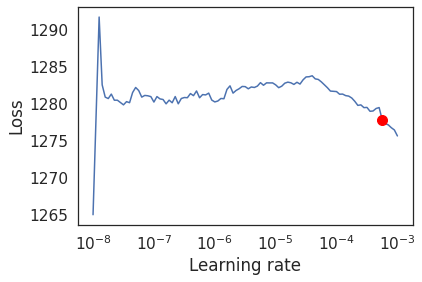

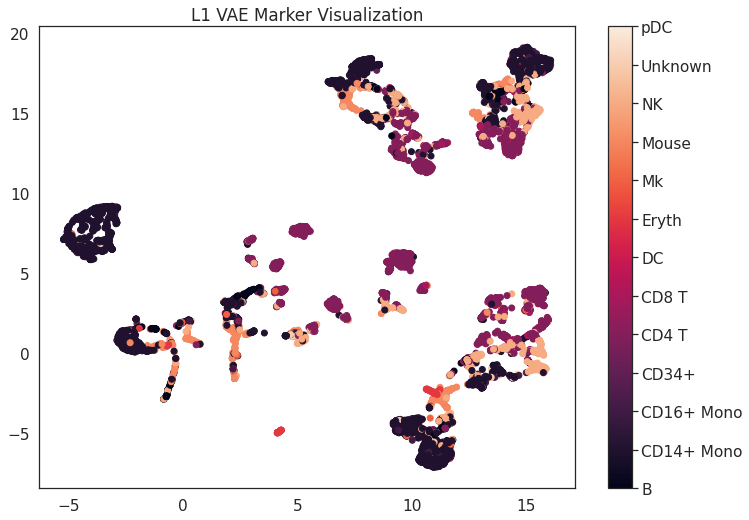

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.981071705534972e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



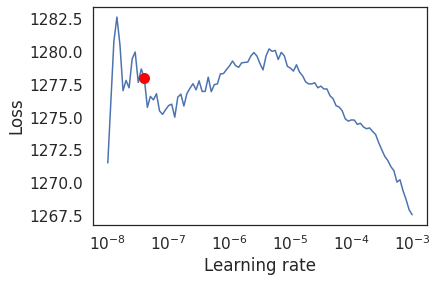

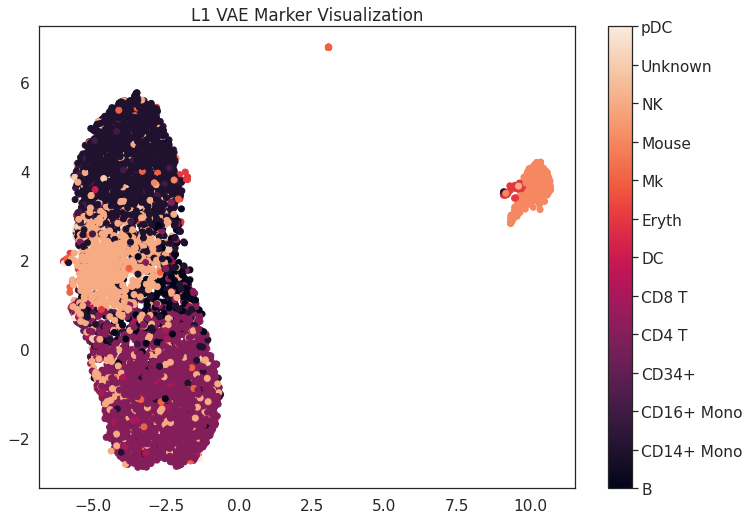

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 0.0008912509381337454


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



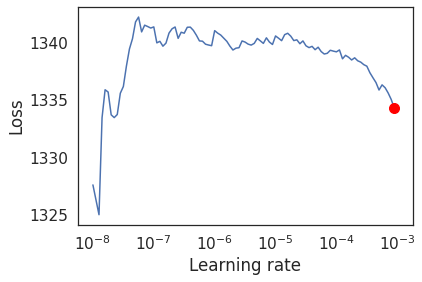

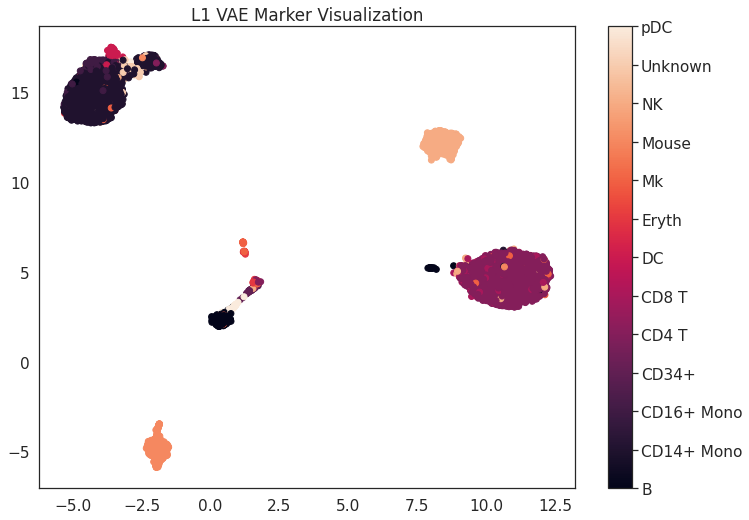

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.5481338923357545e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



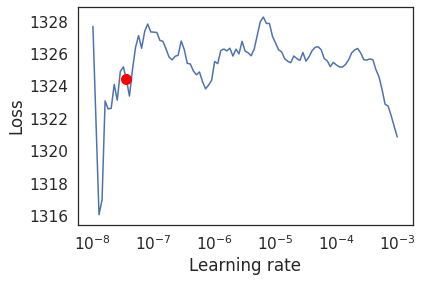

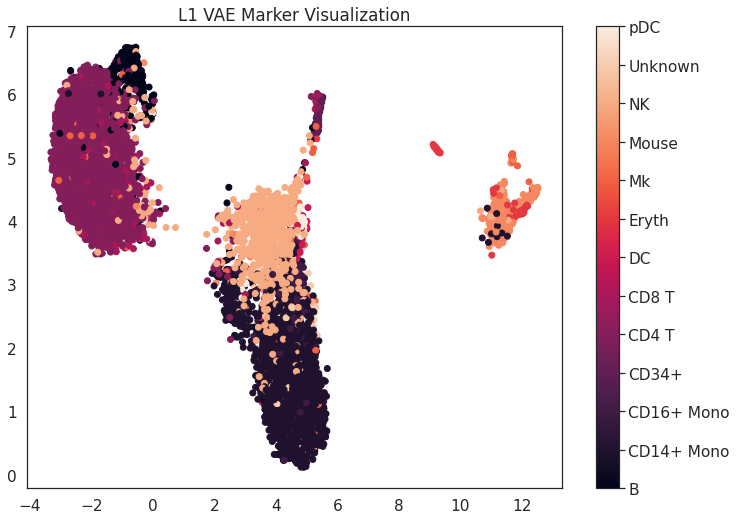

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.5481338923357545e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



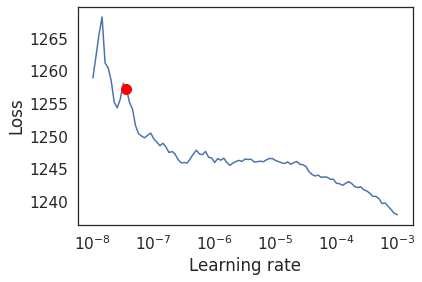

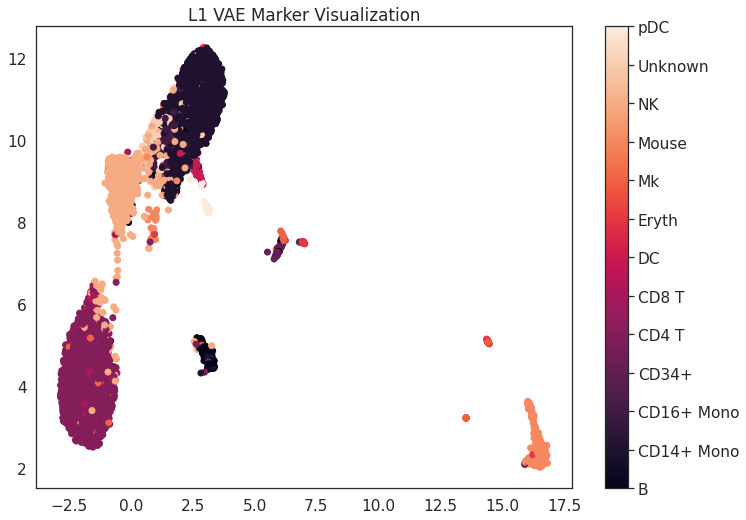

In [ ]:
feature_std = torch.tensor(X).std(dim = 0)
for k in k_range:
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_l1_diag(input_size, hidden_layer_size, z_size, batch_norm = batch_norm)
    tmp_path = model_save_path + 'l1_vae_k_{}.ckpt'.format(k)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, min_epochs = 25, 
                     max_epochs = 100, auto_lr = True, early_stopping_patience = 4, precision = 16)
    l1_markers = model.markers(feature_std = feature_std.to(model.device), k = k).clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = l1_markers)
    np.save(model_save_path + 'l1_vae_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'l1_vae_markers_k_{}.npy'.format(k), l1_markers)
    np.save(model_save_path + 'experiment_data_folds/l1_vae_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'L1 VAE Marker Visualization', path = viz_save_path + 'l1_vae_markers_k_{}.png'.format(k), markers = l1_markers)

In [ ]:
results

(0.08294663573085848,
 {'0': {'f1-score': 0.928,
   'precision': 0.9666666666666667,
   'recall': 0.8923076923076924,
   'support': 65},
  '1': {'f1-score': 0.951686417502279,
   'precision': 0.9125874125874126,
   'recall': 0.9942857142857143,
   'support': 525},
  '10': {'f1-score': 0.9629629629629629,
   'precision': 0.9528795811518325,
   'recall': 0.9732620320855615,
   'support': 187},
  '11': {'f1-score': 0.32432432432432434,
   'precision': 0.8571428571428571,
   'recall': 0.2,
   'support': 30},
  '12': {'f1-score': 0.7499999999999999,
   'precision': 1.0,
   'recall': 0.6,
   'support': 10},
  '2': {'f1-score': 0.8139534883720931,
   'precision': 0.9210526315789473,
   'recall': 0.7291666666666666,
   'support': 48},
  '3': {'f1-score': 0.9787234042553191,
   'precision': 0.9583333333333334,
   'recall': 1.0,
   'support': 23},
  '4': {'f1-score': 0.9392523364485981,
   'precision': 0.8867647058823529,
   'recall': 0.9983443708609272,
   'support': 604},
  '5': {'f1-score': 0

## Train Global Gate

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 1.5085e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



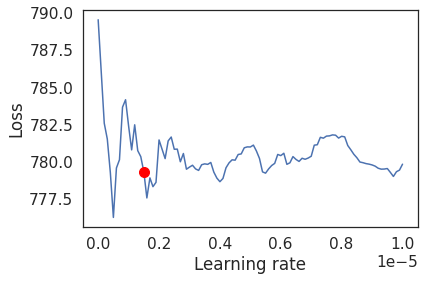

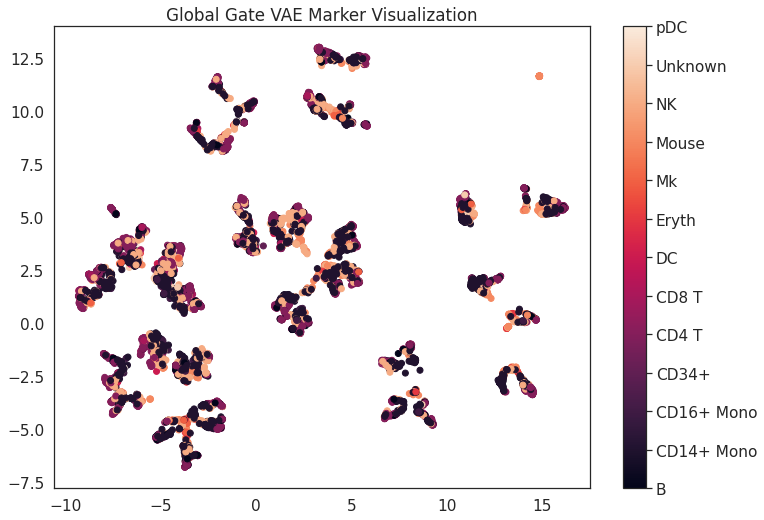

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.1069000000000003e-06


Exception in thread Thread-223:
Traceback (most recent call last):
  File "/usr/lib/python3.7/threading.py", line 926, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.7/dist-packages/tqdm/_monitor.py", line 78, in run
    instances = self.get_instances()
  File "/usr/local/lib/python3.7/dist-packages/tqdm/_monitor.py", line 58, in get_instances
    return [i for i in self.tqdm_cls._instances.copy()
  File "/usr/lib/python3.7/_weakrefset.py", line 92, in copy
    return self.__class__(self)
  File "/usr/lib/python3.7/_weakrefset.py", line 50, in __init__
    self.update(data)
  File "/usr/lib/python3.7/_weakrefset.py", line 119, in update
    for element in other:
  File "/usr/lib/python3.7/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



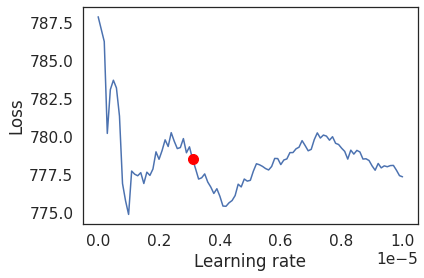

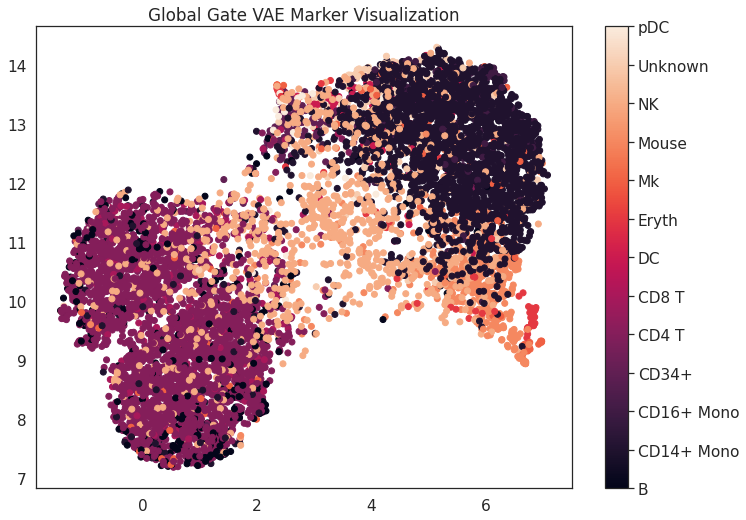

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.4066000000000006e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



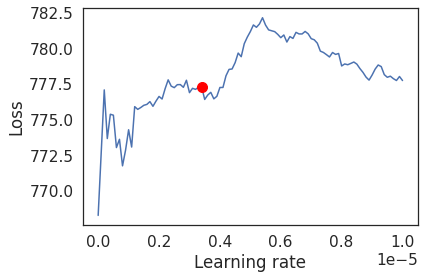

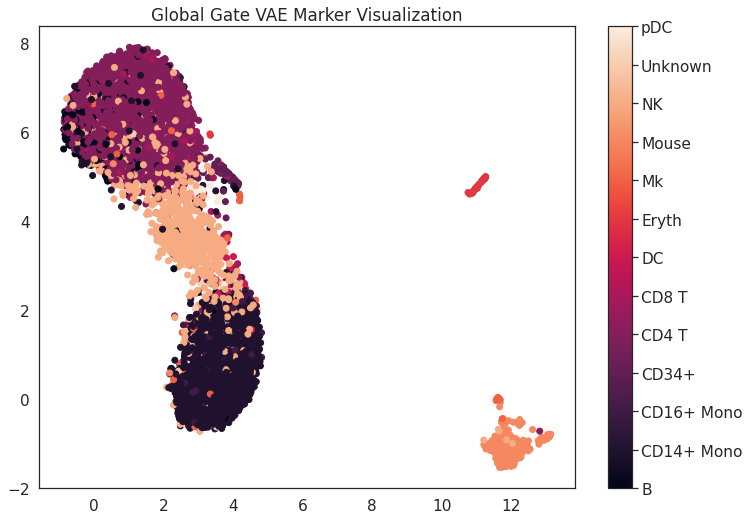

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 1.1089e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



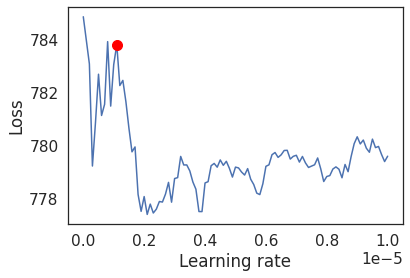

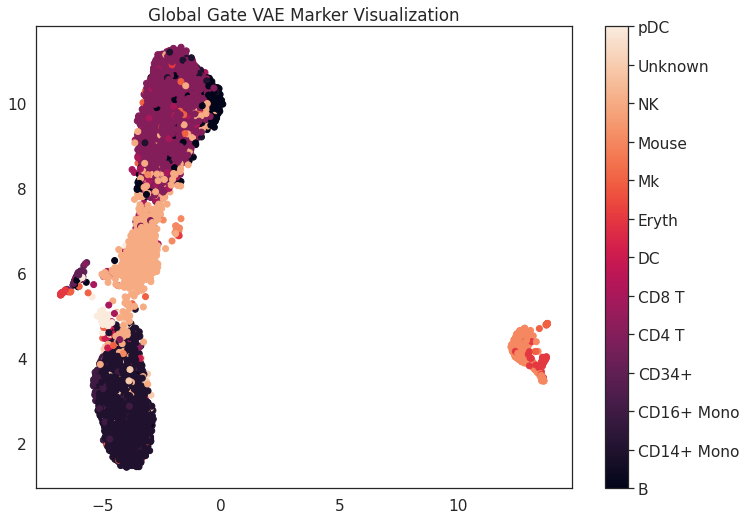

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 2.1079e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



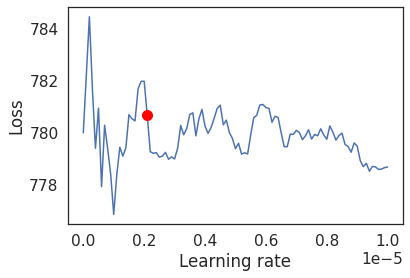

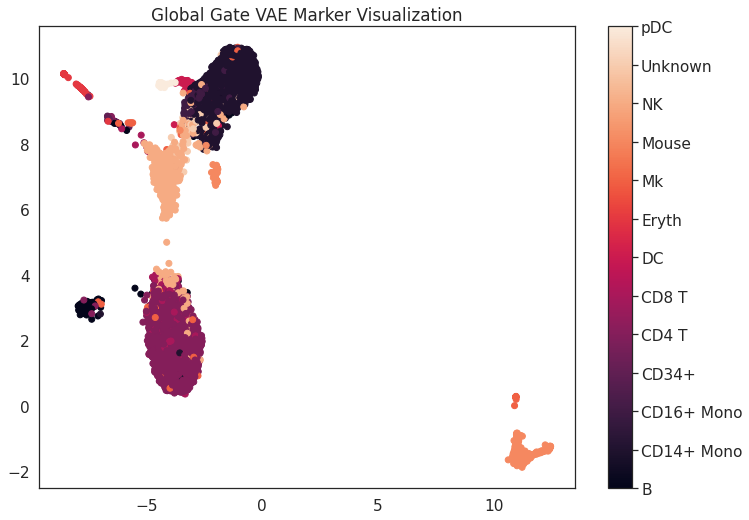

In [ ]:
for k in k_range:
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers=num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_GlobalGate(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'globalgate_vae_k_{}.ckpt'.format(k)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus = gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.00001, early_stopping_patience =  10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    globalgate_markers = model.markers().clone().cpu().detach().numpy()
    
 
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = globalgate_markers)
    np.save(model_save_path + 'globalgate_vae_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'globalgate_vae_markers_k_{}.npy'.format(k), globalgate_markers)
    np.save(model_save_path + 'experiment_data_folds/globalgate_vae_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Global Gate VAE Marker Visualization', path = viz_save_path + 'globalgate_vae_markers_k_{}.png'.format(k), markers = globalgate_markers)

In [ ]:
model.t

tensor(0.0178)

In [ ]:
results

(0.08236658932714613,
 {'0': {'f1-score': 0.9557522123893805,
   'precision': 0.9818181818181818,
   'recall': 0.9310344827586207,
   'support': 58},
  '1': {'f1-score': 0.9464788732394367,
   'precision': 0.8983957219251337,
   'recall': 1.0,
   'support': 504},
  '10': {'f1-score': 0.9699769053117782,
   'precision': 0.9813084112149533,
   'recall': 0.958904109589041,
   'support': 219},
  '11': {'f1-score': 0.3673469387755102,
   'precision': 0.9,
   'recall': 0.23076923076923078,
   'support': 39},
  '12': {'f1-score': 0.9523809523809523,
   'precision': 1.0,
   'recall': 0.9090909090909091,
   'support': 11},
  '2': {'f1-score': 0.7710843373493975,
   'precision': 0.8888888888888888,
   'recall': 0.6808510638297872,
   'support': 47},
  '3': {'f1-score': 0.975609756097561,
   'precision': 0.9523809523809523,
   'recall': 1.0,
   'support': 20},
  '4': {'f1-score': 0.9422924901185771,
   'precision': 0.8922155688622755,
   'recall': 0.998324958123953,
   'support': 597},
  '5': {'f

## Train Running State VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 3.60064e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



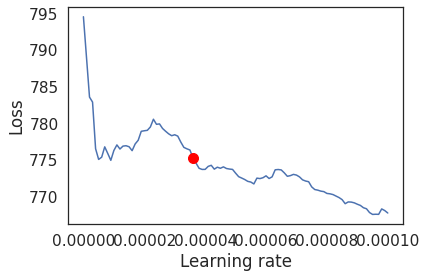

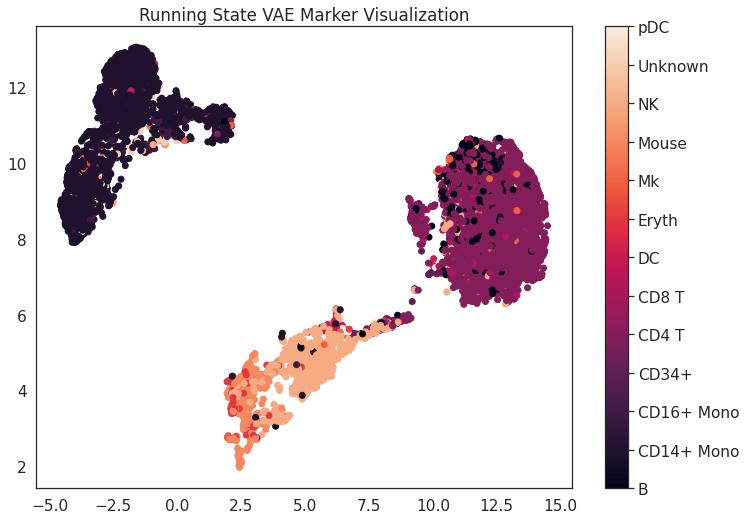

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 2.6007400000000004e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



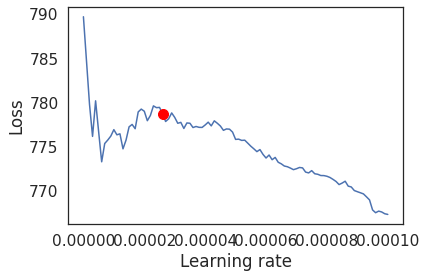

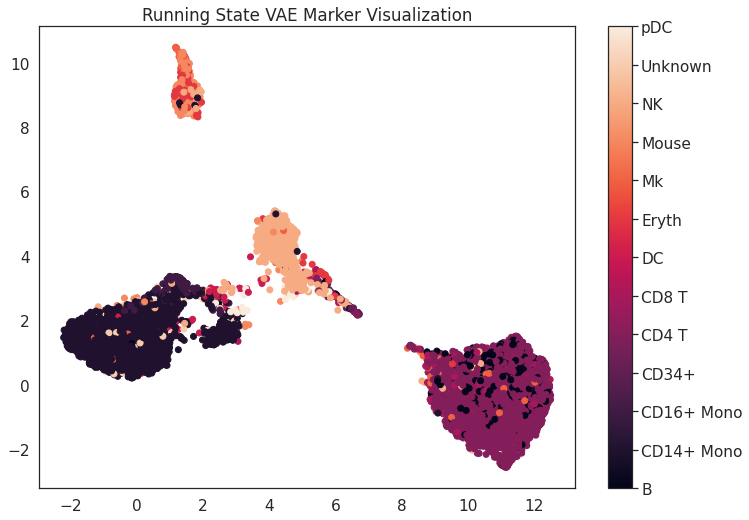

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



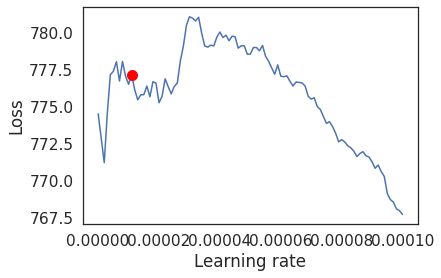

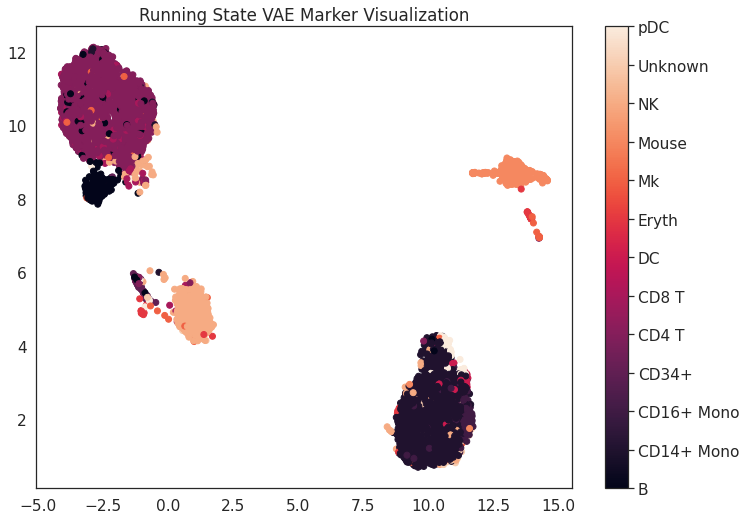

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.50085e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



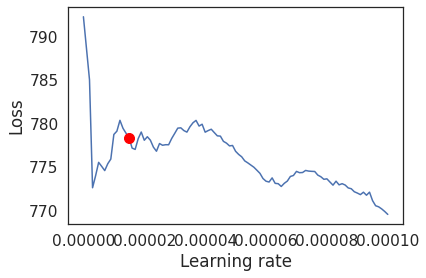

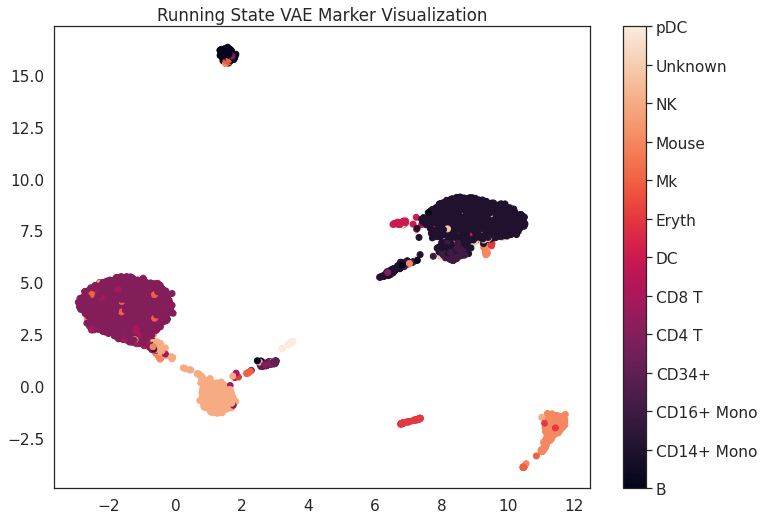

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.50085e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



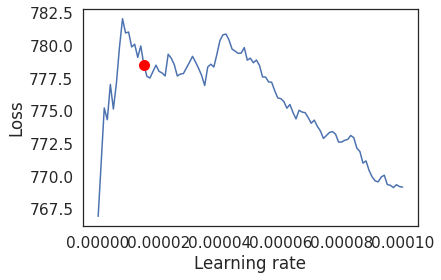

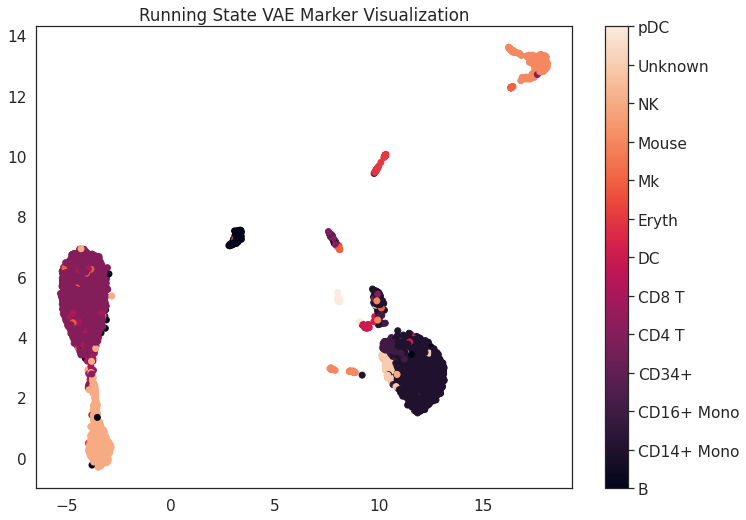

In [ ]:
for k in k_range:
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    model = VAE_Gumbel_RunningState(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_vae_k_{}.ckpt'.format(k)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 4, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_vae_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'runningstate_vae_markers_k_{}.npy'.format(k), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_vae_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State VAE Marker Visualization', path = viz_save_path + 'runningstate_vae_markers_k_{}.png'.format(k), markers = runningstate_markers)

In [ ]:
model.t

tensor(0.0178)

In [ ]:
results

(0.07598607888631093,
 {'0': {'f1-score': 0.9921259842519685,
   'precision': 1.0,
   'recall': 0.984375,
   'support': 64},
  '1': {'f1-score': 0.9472636815920398,
   'precision': 0.9032258064516129,
   'recall': 0.99581589958159,
   'support': 478},
  '10': {'f1-score': 0.9715536105032823,
   'precision': 0.9779735682819384,
   'recall': 0.9652173913043478,
   'support': 230},
  '11': {'f1-score': 0.27906976744186046,
   'precision': 1.0,
   'recall': 0.16216216216216217,
   'support': 37},
  '12': {'f1-score': 1.0, 'precision': 1.0, 'recall': 1.0, 'support': 7},
  '2': {'f1-score': 0.8666666666666666,
   'precision': 0.9069767441860465,
   'recall': 0.8297872340425532,
   'support': 47},
  '3': {'f1-score': 0.9811320754716981,
   'precision': 0.9629629629629629,
   'recall': 1.0,
   'support': 26},
  '4': {'f1-score': 0.9434850863422293,
   'precision': 0.8970149253731343,
   'recall': 0.9950331125827815,
   'support': 604},
  '5': {'f1-score': 0.09375000000000001,
   'precision': 0

In [ ]:
model.t

tensor(0.0178)

## Running State Classifier

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0006900031


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



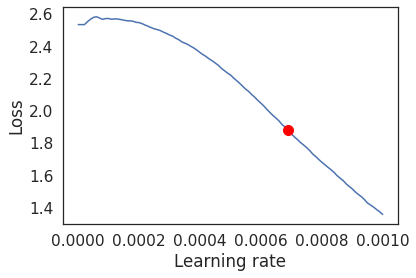

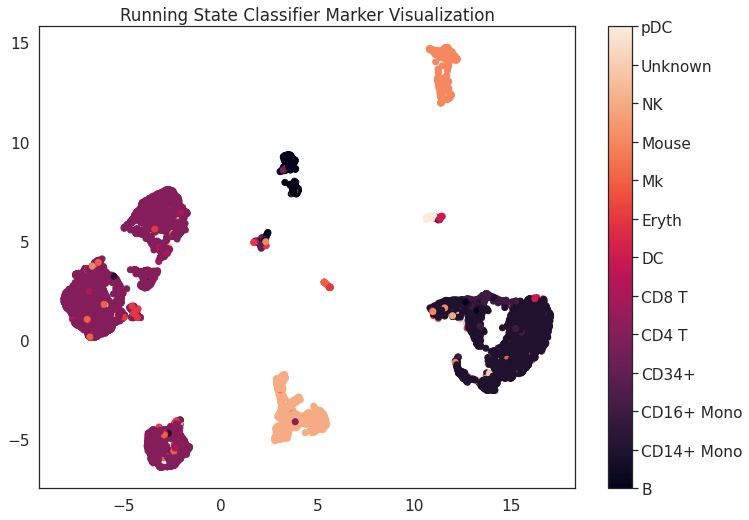

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0008400016


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



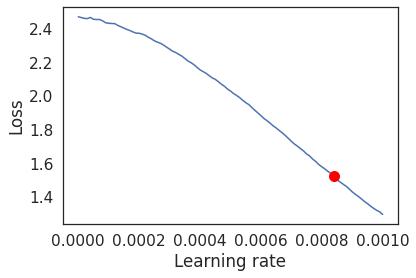

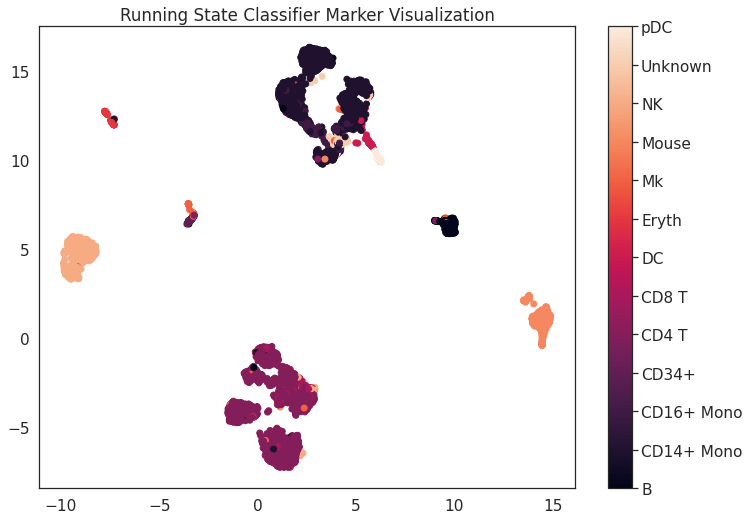

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0006000040000000001


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



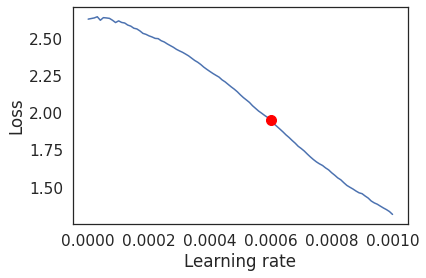

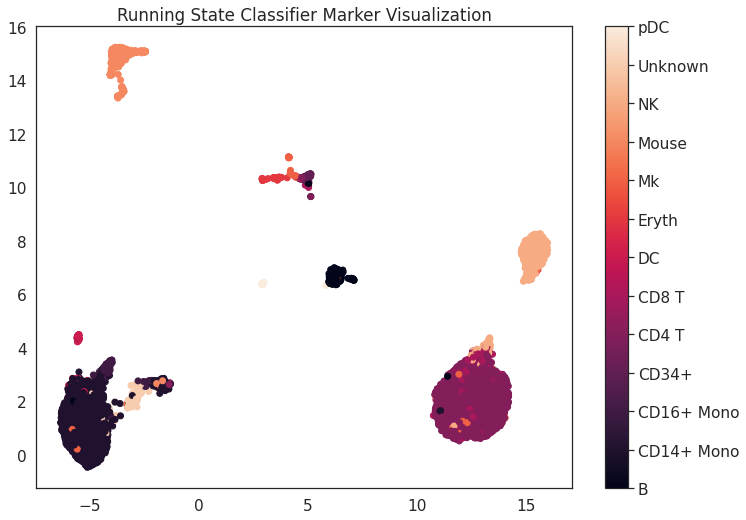

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0006600034000000002


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



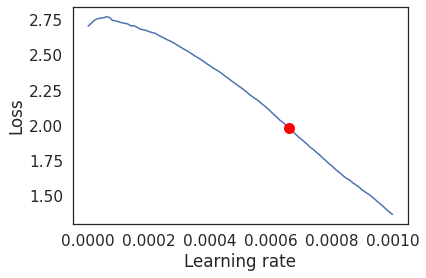

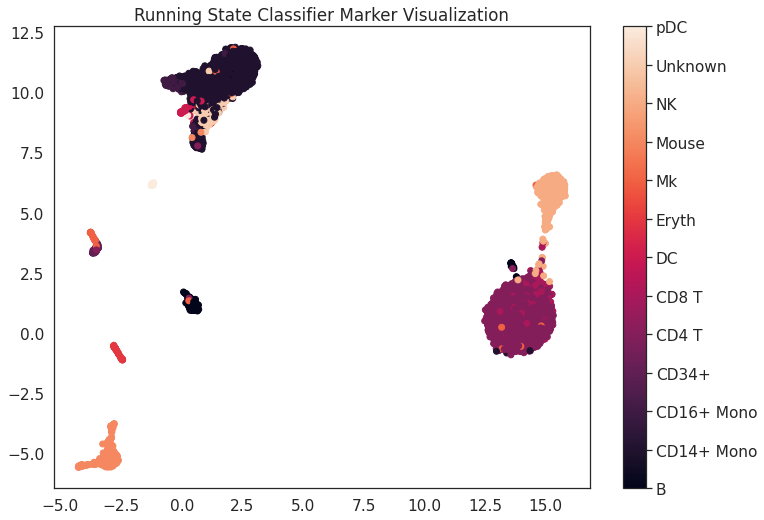

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0006100039000000001


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



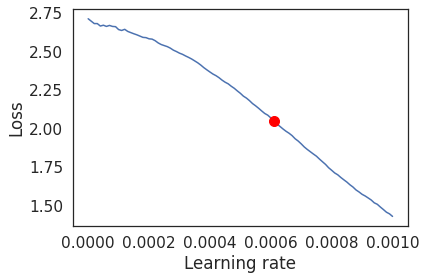

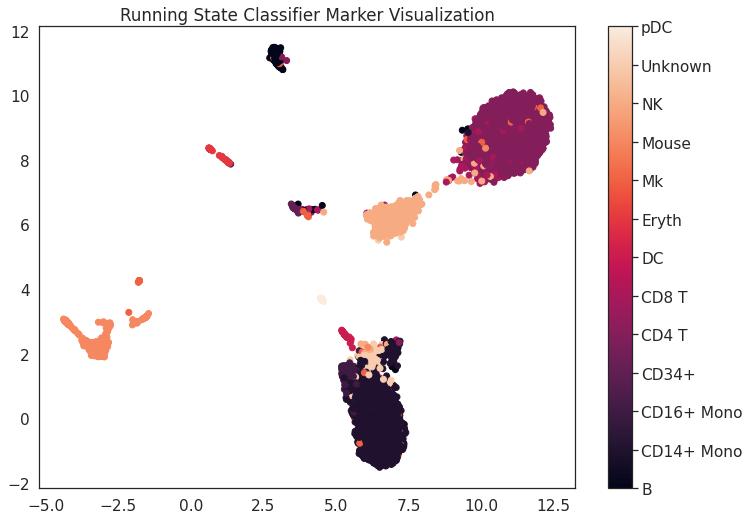

In [ ]:
for k in k_range:
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    
    model = GumbelClassifier(input_size, hidden_layer_size, z_size, num_classes = len(encoder.classes_), 
                             k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_classifier_k_{}.ckpt'.format(k)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, early_stopping_patience = 3, precision = 16, lr_explore_mode = 'linear', num_lr_rates=500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_classifier_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'runningstate_classifier_markers_k_{}.npy'.format(k), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State Classifier Marker Visualization', path = viz_save_path + 'runningstate_classifier_markers_k_{}.png'.format(k), markers = runningstate_markers)

In [ ]:
model.lr

0.0006100039000000001

In [ ]:
model.t

tensor(0.8322)

In [ ]:
model.hparams.lr

0.0006100039000000001

In [ ]:
results

(0.07888631090487241,
 {'0': {'f1-score': 0.9836065573770492,
   'precision': 1.0,
   'recall': 0.967741935483871,
   'support': 62},
  '1': {'f1-score': 0.9454209065679926,
   'precision': 0.9012345679012346,
   'recall': 0.9941634241245136,
   'support': 514},
  '10': {'f1-score': 0.9717223650385605,
   'precision': 0.984375,
   'recall': 0.9593908629441624,
   'support': 197},
  '11': {'f1-score': 0.4230769230769231,
   'precision': 0.8461538461538461,
   'recall': 0.28205128205128205,
   'support': 39},
  '12': {'f1-score': 0.9565217391304348,
   'precision': 1.0,
   'recall': 0.9166666666666666,
   'support': 12},
  '2': {'f1-score': 0.8749999999999999,
   'precision': 0.9130434782608695,
   'recall': 0.84,
   'support': 50},
  '3': {'f1-score': 0.9811320754716981,
   'precision': 0.9629629629629629,
   'recall': 1.0,
   'support': 26},
  '4': {'f1-score': 0.94375,
   'precision': 0.8961424332344213,
   'recall': 0.9966996699669967,
   'support': 606},
  '5': {'f1-score': 0.09375,

## Concrete VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 9.3 K 
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
83.8 K    Trainable params
0         Non-trainable params
83.8 K    Total params
0.335     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 9.3 K 
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
83.8 K    Trainable params
0         Non-trainable params
83.8 K    Total params
0.335     Total estimated model params size (MB)


New Learning Rate 4.300570000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



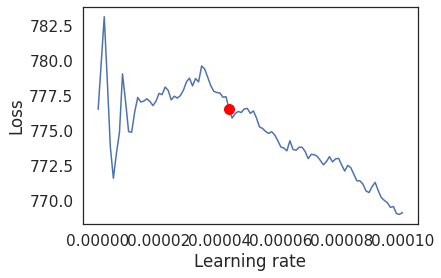

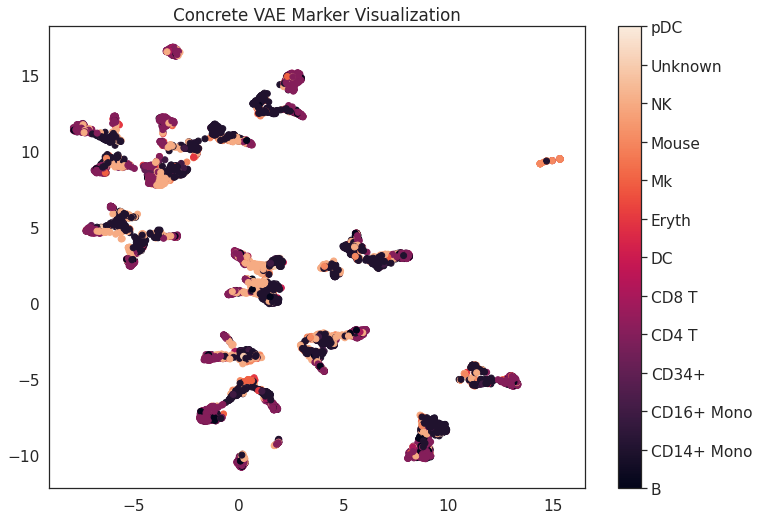

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 10.2 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
92.3 K    Trainable params
0         Non-trainable params
92.3 K    Total params
0.369     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 10.2 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
92.3 K    Trainable params
0         Non-trainable params
92.3 K    Total params
0.369     Total estimated model params size (MB)


New Learning Rate 1.3008700000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



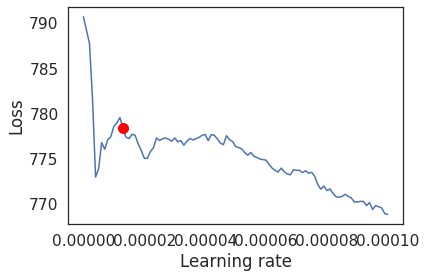

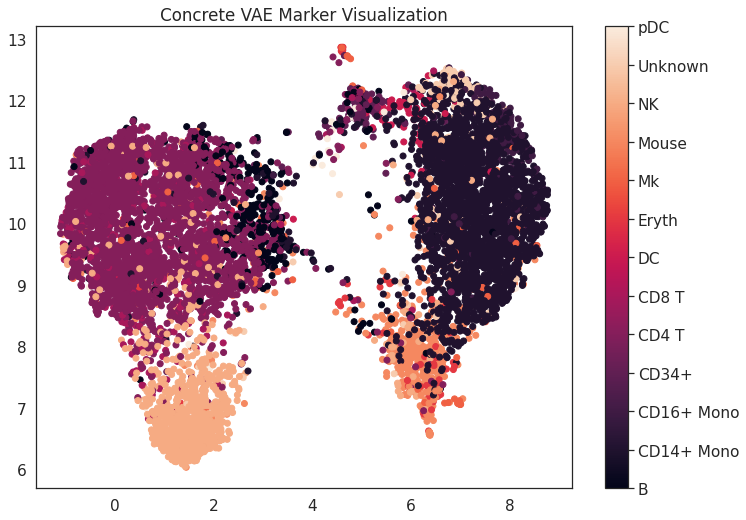

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



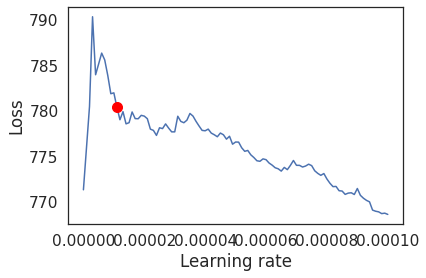

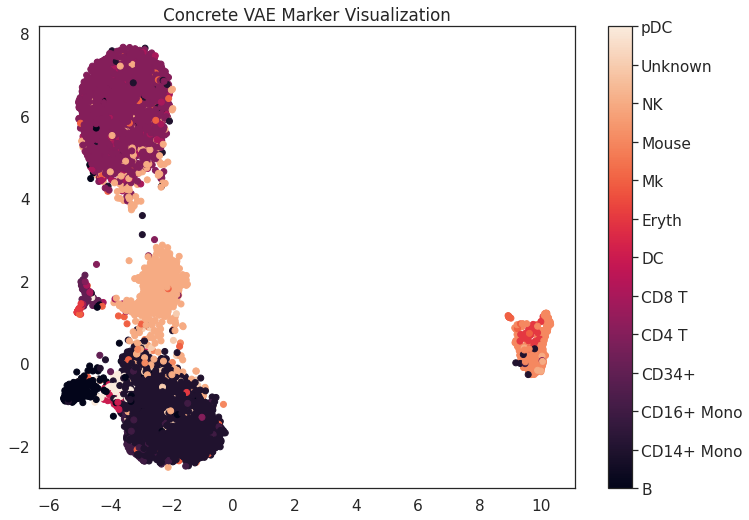

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 15.0 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
134 K     Trainable params
0         Non-trainable params
134 K     Total params
0.538     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 15.0 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
134 K     Trainable params
0         Non-trainable params
134 K     Total params
0.538     Total estimated model params size (MB)


New Learning Rate 2.1007900000000003e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



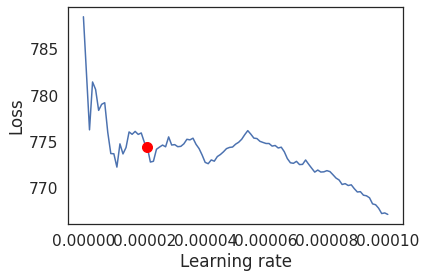

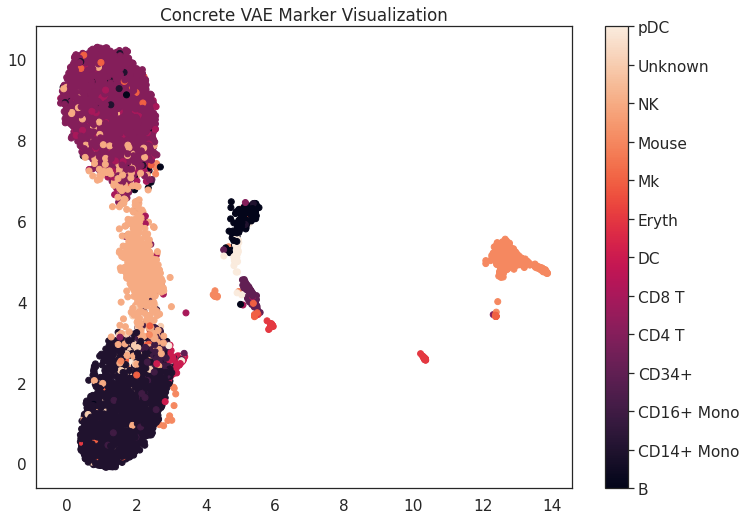

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 24.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
219 K     Trainable params
0         Non-trainable params
219 K     Total params
0.877     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 24.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
219 K     Trainable params
0         Non-trainable params
219 K     Total params
0.877     Total estimated model params size (MB)


New Learning Rate 1.3008700000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



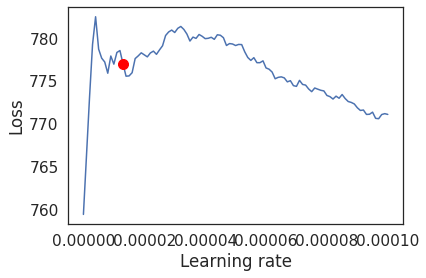

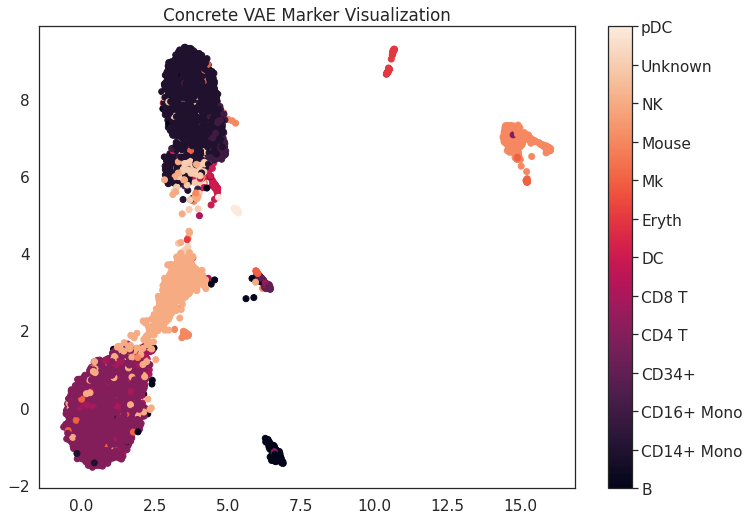

In [ ]:
for k in k_range:
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = ConcreteVAE_NMSL(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay = 0.9, batch_norm = batch_norm)
    tmp_path = model_save_path + 'concrete_vae_k_{}.ckpt'.format(k)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 3, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    concrete_vae_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = concrete_vae_markers)
    np.save(model_save_path + 'concrete_vae_results_k_{}.npy'.format(k), results)
    np.save(model_save_path + 'concrete_vae_markers_k_{}.npy'.format(k), concrete_vae_markers)
    np.save(model_save_path + 'experiment_data_folds/concrete_vae_indices_k_{}.npy'.format(k), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Concrete VAE Marker Visualization', path = viz_save_path + 'concrete_vae_markers_k_{}.png'.format(k), markers = concrete_vae_markers)

In [ ]:
results = np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)

In [ ]:
results

array([0.08236658932714613,
       {'0': {'precision': 0.9069767441860465, 'recall': 0.9629629629629629, 'f1-score': 0.934131736526946, 'support': 81}, '1': {'precision': 0.8982035928143712, 'recall': 0.9933774834437086, 'f1-score': 0.9433962264150942, 'support': 453}, '2': {'precision': 1.0, 'recall': 0.6739130434782609, 'f1-score': 0.8051948051948052, 'support': 46}, '3': {'precision': 0.9655172413793104, 'recall': 0.9333333333333333, 'f1-score': 0.9491525423728815, 'support': 30}, '4': {'precision': 0.9052924791086351, 'recall': 0.9938837920489296, 'f1-score': 0.9475218658892128, 'support': 654}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 57}, '6': {'precision': 1.0, 'recall': 0.7058823529411765, 'f1-score': 0.8275862068965517, 'support': 17}, '7': {'precision': 1.0, 'recall': 0.7222222222222222, 'f1-score': 0.8387096774193548, 'support': 18}, '8': {'precision': 0.5, 'recall': 0.07692307692307693, 'f1-score': 0.13333333333333336, 'support': 13}, '9': {'precis

## Get Model Metrics from KNNs Classifiers


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
def generate_metrics_from_saved_files(X, y, folds_path, markers_path, classifier_model, save_path):
    train_indices, val_indices, test_indices = np.load(folds_path, allow_pickle = True)
    markers = np.load(markers_path, allow_pickle = True)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices, :]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = markers, model = classifier_model)

    np.save(save_path, results)
    return

In [ ]:
def batch_generate_metrics_from_saved_files(X, y, format_folds_path, format_markers_path, format_save_path):
    for tryy in range(1, num_times+1):
        classifier_model = KNeighborsClassifier()
        generate_metrics_from_saved_files(X, y, format_folds_path.format(tryy), format_markers_path.format(tryy), classifier_model, format_save_path.format(tryy))
    return

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/l1_vae_indices_{}.npy',
                                  model_save_path+'l1_vae_markers_{}.npy',
                                  model_save_path+'l1_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_rf_indices_{}.npy',
                                  model_save_path+'smash_rf_markers_{}.npy',
                                  model_save_path+'smash_rf_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: Visible

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_indices_{}.npy',
                                  model_save_path+'smash_markers_{}.npy',
                                  model_save_path+'smash_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/rankcorr_indices_{}.npy',
                                  model_save_path+'rankcorr_markers_{}.npy',
                                  model_save_path+'rankcorr_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/globalgate_vae_indices_{}.npy',
                                  model_save_path+'globalgate_vae_markers_{}.npy',
                                  model_save_path+'globalgate_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_vae_indices_{}.npy',
                                  model_save_path+'runningstate_vae_markers_{}.npy',
                                  model_save_path+'runningstate_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_classifier_indices_{}.npy',
                                  model_save_path+'runningstate_classifier_markers_{}.npy',
                                  model_save_path+'runningstate_classifier_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/concrete_vae_indices_{}.npy',
                                  model_save_path+'concrete_vae_markers_{}.npy',
                                  model_save_path+'concrete_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: Visible

# Results and Visualizations

In [ ]:
k = 50

## Accuracies and F1

In [ ]:
result_axis = [
 ('L1 VAE', 'l1_vae_results_{}.npy', 'l1_vae_knn_results_{}.npy'),
 ('Smash RF', 'smash_rf_results_{}.npy', 'smash_rf_knn_results_{}.npy'),
 ('SMaSH DNN', 'smash_results_{}.npy', 'smash_knn_results_{}.npy'),
 ('RankCorr', 'rankcorr_results_{}.npy', 'rankcorr_knn_results_{}.npy'),
 ('Global Gate VAE', 'globalgate_vae_results_{}.npy', 'globalgate_vae_knn_results_{}.npy'),
 ('RunningGumbel VAE', 'runningstate_vae_results_{}.npy', 'runningstate_vae_knn_results_{}.npy'),
 ('RunningGumbel Classifier', 'runningstate_classifier_results_{}.npy', 'runningstate_classifier_knn_results_{}.npy'),
 ('Concrete VAE',  'concrete_vae_results_{}.npy', 'concrete_vae_knn_results_{}.npy')
]

In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[1], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
L1 VAE,0.122854,0.844842,0.016404,0.020716
Smash RF,0.068561,0.915151,0.002088,0.003580
SMaSH DNN,0.067053,0.917462,0.003606,0.005150
RankCorr,0.068677,0.911849,0.004045,0.005910
Global Gate VAE,0.125986,0.837386,0.023414,0.031153
RunningGumbel VAE,0.092923,0.881889,0.009240,0.012684
RunningGumbel Classifier,0.062877,0.923783,0.004062,0.005541
Concrete VAE,0.124478,0.838116,0.023125,0.031114


In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[2], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
L1 VAE,0.178190,0.797884,0.021568,0.024682
Smash RF,0.072506,0.914602,0.002320,0.004322
SMaSH DNN,0.066705,0.920939,0.003576,0.005118
RankCorr,0.080858,0.905313,0.003104,0.005212
Global Gate VAE,0.200348,0.770226,0.028639,0.032964
RunningGumbel VAE,0.115545,0.873742,0.017345,0.018876
RunningGumbel Classifier,0.062065,0.928886,0.006764,0.008644
Concrete VAE,0.182483,0.788696,0.024545,0.028788


## Confusion Matrices

k = 50

In [ ]:
# https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          save_path = None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


k = 50

### Smash RF

In [ ]:
results =  np.load(model_save_path + 'smash_rf_results_{}.npy'.format(1), allow_pickle = True)

In [ ]:
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash Random Forest Confusion Matrix', save_path = viz_save_path + 'smash_rf_cm.png')

### RankCorr

In [ ]:
results =  np.load(model_save_path + 'smash_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash DNN Confusion Matrix', save_path = viz_save_path + 'smash_dnn_cm.png')

### L1 VAE

In [ ]:
results =  np.load(model_save_path + 'l1_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'L1 VAE Confusion Matrix', save_path = viz_save_path + 'l1_vae_cm.png')

### Global Gate VAE

In [ ]:
results =  np.load(model_save_path + 'globalgate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'GlobalGate VAE Confusion Matrix', save_path = viz_save_path + 'globalgate_vae_cm.png')

### Running Gumbel VAE

In [ ]:
results =  np.load(model_save_path + 'runningstate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel VAE Confusion Matrix', save_path = viz_save_path + 'runningstate_vae_cm.png')

### Running Gumbel Classifier


In [ ]:
results =  np.load(model_save_path + 'runningstate_classifier_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel Classifier Confusion Matrix', save_path = viz_save_path + 'runningstate_classifier_cm.png')

### Concrete VAE

In [ ]:
results =  np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Concrete VAE Confusion Matrix', save_path = viz_save_path + 'concrete_vae_cm.png')

## UMap Visualization

In [ ]:
import cv2

In [ ]:
img = cv2.imread(viz_save_path + 'smash_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

In [ ]:
img = cv2.imread(viz_save_path + 'rankcorr_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_classifier_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

In [ ]:
img = cv2.imread(viz_save_path + 'concrete_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

## Visualizing Reconstructions

from first model of each

## L1 VAE

In [ ]:
model = load_model(VAE_l1_diag, model_save_path + 'l1_vae_{}.ckpt'.format(1))
l1_vae_markers = np.load(model_save_path + 'l1_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'L1 VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_l1_vae_{}.png'.format(1), markers = l1_vae_markers)

### Global Gate VAE

In [ ]:
model = load_model(VAE_Gumbel_GlobalGate, model_save_path + 'globalgate_vae_{}.ckpt'.format(1))
globalgate_vae_markers = np.load(model_save_path + 'globalgate_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Global Gate VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_globalgate_vae_{}.png'.format(1), markers = globalgate_vae_markers)

### Running State Gumbel VAE

In [ ]:
model = load_model(VAE_Gumbel_RunningState, model_save_path + 'runningstate_vae_{}.ckpt'.format(1))


In [ ]:
runningstate_vae_markers = np.load(model_save_path + 'runningstate_vae_markers_{}.npy'.format(1), allow_pickle=True)

In [ ]:
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]

In [ ]:
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Running State Reconstruction Marker Visualization', path = viz_save_path + 'recon_runningstate_vae_{}.png'.format(1), markers = runningstate_vae_markers)

Concrete VAE

In [ ]:
model = load_model(ConcreteVAE_NMSL, model_save_path + 'concrete_vae_{}.ckpt'.format(1))
concrete_vae_markers = np.load(model_save_path + 'concrete_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Concrete VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_concrete_vae_{}.png'.format(1), markers = concrete_vae_markers)

## Visualizing k on weighted f1

In [ ]:
smash_rf_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'smash_rf_results_k_{}.npy'.format(k_i), allow_pickle = True)
    smash_rf_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
smash_dnn_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'smash_rf_results_k_{}.npy'.format(k_i), allow_pickle = True)
    smash_dnn_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
rank_corr_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'rankcorr_results_k_{}.npy'.format(k_i), allow_pickle = True)
    rank_corr_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
l1_vae_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'l1_vae_results_k_{}.npy'.format(k_i), allow_pickle = True)
    l1_vae_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
globalgate_vae_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'globalgate_vae_results_k_{}.npy'.format(k_i), allow_pickle = True)
    globalgate_vae_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
runningstate_vae_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'runningstate_vae_results_k_{}.npy'.format(k_i), allow_pickle = True)
    runningstate_vae_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
runningstate_classifier_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'runningstate_classifier_results_k_{}.npy'.format(k_i), allow_pickle = True)
    runningstate_classifier_scores.append(rep['weighted avg']['f1-score'])

In [ ]:
concrete_scores = []
for k_i in k_range:
    _, rep, _ = np.load(model_save_path + 'concrete_vae_results_k_{}.npy'.format(k_i), allow_pickle = True)
    concrete_scores.append(rep['weighted avg']['f1-score'])

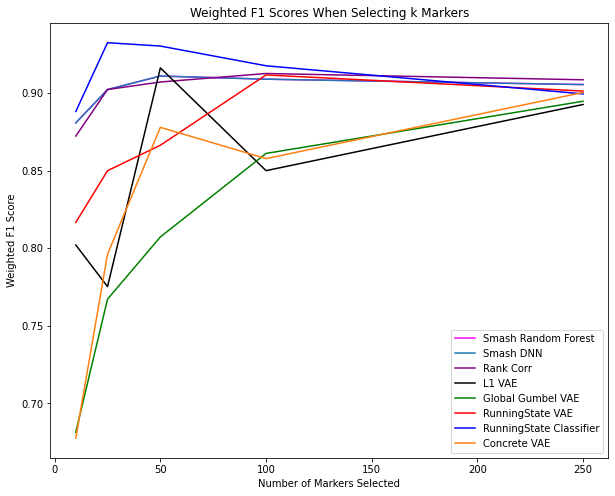

In [ ]:
fig = plt.figure(figsize = (10,8))
plt.plot(k_range, smash_rf_scores, label = 'Smash Random Forest', color = 'magenta')
plt.plot(k_range, smash_dnn_scores, label = 'Smash DNN')
plt.plot(k_range, rank_corr_scores, label = 'Rank Corr', color = 'purple')
plt.plot(k_range, l1_vae_scores, label = 'L1 VAE', color = 'black')
plt.plot(k_range, globalgate_vae_scores, label = 'Global Gumbel VAE', color = 'green')
plt.plot(k_range, runningstate_vae_scores, label = 'RunningState VAE', color = 'red')
plt.plot(k_range, runningstate_classifier_scores, label = 'RunningState Classifier', color = 'blue')
plt.plot(k_range, concrete_scores, label = 'Concrete VAE')
plt.xlabel("Number of Markers Selected")
plt.ylabel("Weighted F1 Score")
plt.title("Weighted F1 Scores When Selecting k Markers")
plt.legend()
plt.savefig(viz_save_path + 'CiteSeq_f1_vs_k.png')

## Visualize Marker Selection

### Smash RF

In [ ]:
smash_rf_markers = {}
smash_rf_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/smash_rf_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'smash_rf_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'smash_rf_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    smash_rf_markers[k] = marker_data
    smash_rf_f1[k] = weighted_f1_score

### Smash DNN

In [ ]:
smash_dnn_markers = {}
smash_dnn_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/smash_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'smash_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'smash_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    smash_dnn_markers[k] = marker_data
    smash_dnn_f1[k] = weighted_f1_score

###RankCorr

In [ ]:
rankcorr_markers ={}
rankcorr_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/rankcorr_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'rankcorr_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'rankcorr_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    rankcorr_markers[k] = marker_data
    rankcorr_f1[k] = weighted_f1_score

### L1 VAE

In [ ]:
l1_vae_markers = {}
l1_vae_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/l1_vae_indices_k_{}.npy'.format(k), allow_pickle = True)
    X_train = X[train_indices, :]
    feature_std = np.apply_along_axis(np.std, 0, X_train)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'l1_vae_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']

    model = load_model(VAE_l1_diag, model_save_path + 'l1_vae_k_{}.ckpt'.format(k))
    with torch.no_grad():
        markers = model.markers(feature_std, k)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    l1_vae_markers[k] = marker_data
    l1_vae_f1[k] = weighted_f1_score

### GlobalGate VAE

In [ ]:
globalgate_vae_markers = {}
globalgate_vae_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/globalgate_vae_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'globalgate_vae_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'globalgate_vae_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    globalgate_vae_markers[k] = marker_data
    globalgate_vae_f1[k] = weighted_f1_score

### RuningState VAE

In [ ]:
runningstate_vae_markers = {}
runningstate_vae_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/runningstate_vae_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'runningstate_vae_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'runningstate_vae_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    runningstate_vae_markers[k] = marker_data
    runningstate_vae_f1[k] = weighted_f1_score

###RunningState Classifier

In [ ]:
runningstate_classifier_markers = {}
runningstate_classifier_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'runningstate_classifier_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'runningstate_classifier_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    runningstate_classifier_markers[k] = marker_data
    runningstate_classifier_f1[k] = weighted_f1_score

###Concrete VAE

In [ ]:
concrete_vae_markers = {}
concrete_vae_f1 = {}

In [ ]:
for k in k_range:
    train_indices, val_indices, test_indices = np.load(model_save_path + 'experiment_data_folds/concrete_vae_indices_k_{}.npy'.format(k), allow_pickle = True)
    misclass_rate, test_rep, cm = np.load(model_save_path + 'concrete_vae_results_k_{}.npy'.format(k), allow_pickle=True)
    weighted_f1_score = test_rep['weighted avg']['f1-score']
    markers = np.load(model_save_path + 'concrete_vae_markers_k_{}.npy'.format(k), allow_pickle = True)
    marker_data = np.zeros(X.shape[1])
    marker_data[markers] = 1
    concrete_vae_markers[k] = marker_data
    concrete_vae_f1[k] = weighted_f1_score

###The Actual Subplot

In [ ]:
def plot_row(ax, name, k_range, markers, f1):
    assert len(ax) == len(k_range)
    for i in range(len(k_range)):
        col = ax[i]
        k = k_range[i]
        if i == 0:
            col.set_ylabel("{}".format(name))
        col.set_ylim([0, 1.2])
        col.set_yticks([0, 1.0])
        col.set_title("{} Markers(Weighted F1 {:.3g})".format(k, f1[k]))        
        col.bar(range(X.shape[1]), markers[k])
    return

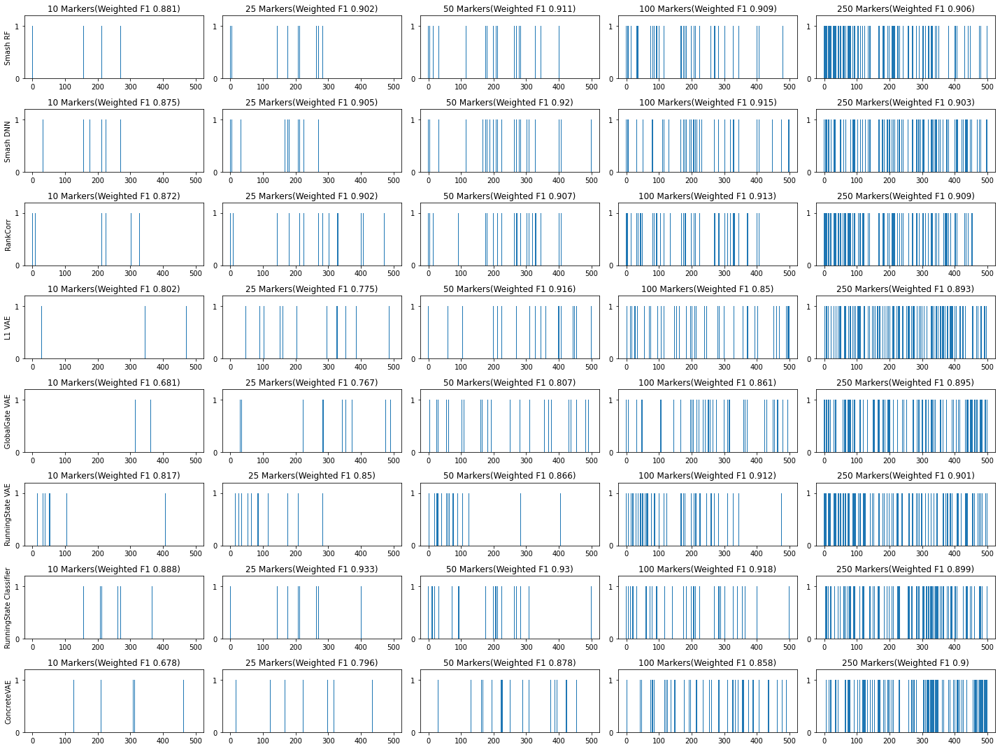

In [ ]:
fig, axs = plt.subplots(nrows=8, ncols = len(k_range), figsize = (20, 15))

plot_row(axs[0], 'Smash RF', k_range, smash_rf_markers, smash_rf_f1)
plot_row(axs[1], 'Smash DNN', k_range, smash_dnn_markers, smash_dnn_f1)
plot_row(axs[2], 'RankCorr', k_range, rankcorr_markers, rankcorr_f1)
plot_row(axs[3], 'L1 VAE', k_range, l1_vae_markers, l1_vae_f1)
plot_row(axs[4], 'GlobalGate VAE', k_range, globalgate_vae_markers, globalgate_vae_f1)
plot_row(axs[5], 'RunningState VAE', k_range, runningstate_vae_markers, runningstate_vae_f1)
plot_row(axs[6], 'RunningState Classifier', k_range, runningstate_classifier_markers, runningstate_classifier_f1)
plot_row(axs[7], 'ConcreteVAE', k_range, concrete_vae_markers, concrete_vae_f1)

plt.tight_layout()
plt.savefig(viz_save_path + 'CiteSeq_SelectedMarkers_All_Methods_ks.png')
plt.show()

In [ ]:
plt.close('all')

# Things to note for paper

PySmash uses a seed internally so the model is deterministic to a particular dataset. We used various different train seeds, whereas the smash paper uses the whole dataset for the data.

For smash DNN, to select the markers, I had to use all the data. Couldn't just use train and val set.